# BigData Task 3

Imports

In [1]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np


Data Loading

In [2]:
df = pd.read_csv("data/combined.csv")
print(df.columns)
display(df.head())


Index(['location_key', 'date', 'iso_3166_1_alpha_3', 'country_name',
       'new_confirmed', 'cumulative_confirmed', 'new_tested',
       'cumulative_tested', 'new_recovered', 'cumulative_recovered',
       'new_deceased', 'cumulative_deceased', 'new_persons_vaccinated',
       'cumulative_persons_vaccinated', 'new_persons_fully_vaccinated',
       'cumulative_persons_fully_vaccinated', 'new_vaccine_doses_administered',
       'cumulative_vaccine_doses_administered', 'smoking_prevalence',
       'diabetes_prevalence', 'hospital_beds_per_1000', 'nurses_per_1000',
       'physicians_per_1000', 'health_expenditure_usd', 'population_urban',
       'population_age_80_and_older', 'population_clustered',
       'stringency_index', 'emergency_investment_in_healthcare',
       'investment_in_vaccines', 'fiscal_measures', 'GDP', 'Population',
       'Rank', 'Capital', 'Continent', 'Area (km²)', 'Density (per km²)',
       'Growth Rate', 'World Population Percentage',
       'Unemployment, total 

,location_key,date,iso_3166_1_alpha_3,country_name,new_confirmed,cumulative_confirmed,new_tested,cumulative_tested,new_recovered,cumulative_recovered,...,Cost of Living Index,Rent Index,Cost of Living Plus Rent Index,Groceries Index,Restaurant Price Index,Local Purchasing Power Index,median_salary,average_salary,lowest_salary,highest_salary
0,AD,2020-01-01,AND,Andorra,0,0.0,0,0.0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3668.08,4069.77,1120.51,17653.28
1,AD,2020-01-02,AND,Andorra,0,0.0,180,180.0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3668.08,4069.77,1120.51,17653.28
2,AD,2020-01-03,AND,Andorra,0,0.0,180,360.0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3668.08,4069.77,1120.51,17653.28
3,AD,2020-01-04,AND,Andorra,0,0.0,180,540.0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3668.08,4069.77,1120.51,17653.28
4,AD,2020-01-05,AND,Andorra,0,0.0,180,720.0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3668.08,4069.77,1120.51,17653.28


1. Analysis of changes in phenomena over time

In [3]:
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(['iso_3166_1_alpha_3', 'date'])
df = df.sort_values(['iso_3166_1_alpha_3', 'date'])
df = df.set_index('date')

window_size = 7
countries = ['POL', 'DEU', 'FRA', 'ESP', 'ITA',
             'GBR', 'NLD', 'BEL', 'SWE', 'AUT']


In [4]:
def plot_country(ax, df, iso3, base_col, mean_col, std_col, window_size=7):
    """
    Rysuje na wykresie liniowym:
      - bazowe dane z kolumny base_col,
      - rolling mean z kolumny mean_col,
      - ±1σ fill_between z kolumny std_col.
    """
    df_c = df[df['iso_3166_1_alpha_3'] == iso3]
    country = df_c['country_name'].iloc[0] if not df_c.empty else iso3

    ax.plot(df_c.index, df_c[base_col],
            label=base_col, zorder=1)
    ax.plot(df_c.index, df_c[mean_col],
            label=f'{window_size}-days mean', zorder=1)
    ax.fill_between(
        df_c.index,
        df_c[mean_col] - df_c[std_col],
        df_c[mean_col] + df_c[std_col],
        color='green', alpha=0.5, label='±1σ', zorder=2
    )

    # formatowanie osi X
    locator = mdates.AutoDateLocator()
    fmt = mdates.DateFormatter('%m.%Y')
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(fmt)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

    ax.set_title(country)
    ax.set_xlabel('Data')
    ax.set_ylabel(base_col)


1.1 Moving average and moving standard deviation for the number of new cases

In [5]:
df['new_confirmed_rolling_mean'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_confirmed']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).mean())
)

df['new_confirmed_rolling_std'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_confirmed']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).std())
)
display(df.head())

,location_key,iso_3166_1_alpha_3,country_name,new_confirmed,cumulative_confirmed,new_tested,cumulative_tested,new_recovered,cumulative_recovered,new_deceased,...,Cost of Living Plus Rent Index,Groceries Index,Restaurant Price Index,Local Purchasing Power Index,median_salary,average_salary,lowest_salary,highest_salary,new_confirmed_rolling_mean,new_confirmed_rolling_std
date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,AW,ABW,Aruba,0,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,NaN
2020-01-02,AW,ABW,Aruba,0,0.0,1,1.0,0,0.0,0,...,0.0,0.0,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,0.0
2020-01-03,AW,ABW,Aruba,0,0.0,1,2.0,0,0.0,0,...,0.0,0.0,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,0.0
2020-01-04,AW,ABW,Aruba,0,0.0,1,3.0,0,0.0,0,...,0.0,0.0,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,0.0
2020-01-05,AW,ABW,Aruba,0,0.0,1,4.0,0,0.0,0,...,0.0,0.0,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,0.0


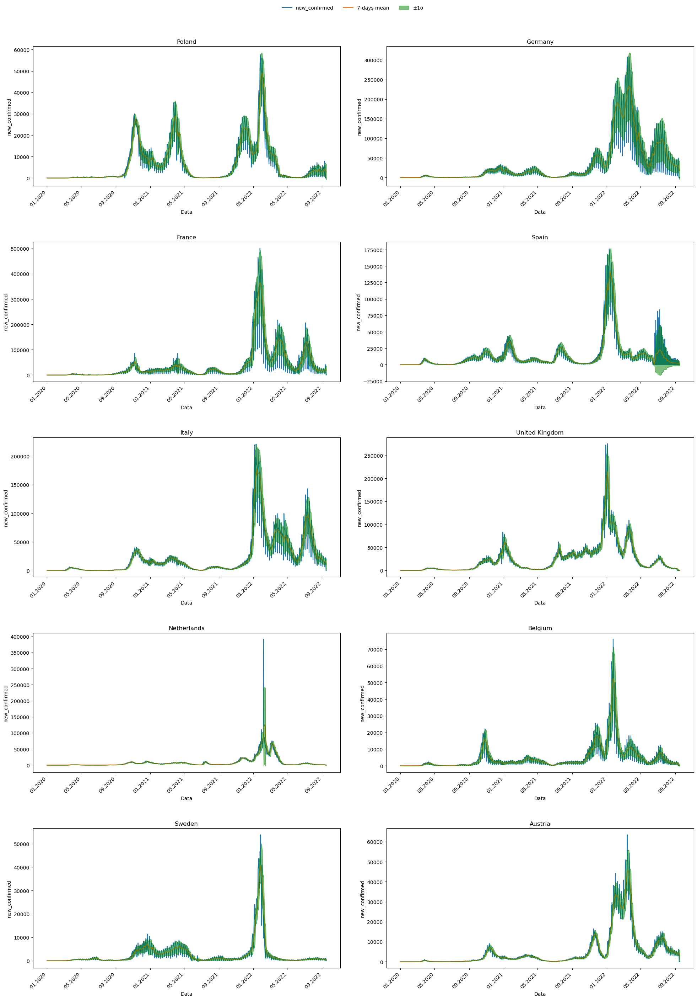

In [6]:
fig, axes = plt.subplots(
    5, 2,
    figsize=(24, 32),
    gridspec_kw={'hspace': 0.4, 'wspace': 0.15}
)

for ax, iso in zip(axes.flat, countries):
    plot_country(
        ax, df, iso,
        base_col='new_confirmed',
        mean_col='new_confirmed_rolling_mean',
        std_col='new_confirmed_rolling_std',
        window_size=window_size
    )

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, frameon=False, bbox_to_anchor=(0.5, 0.96))
fig.subplots_adjust(top=0.92)
plt.show()

1.2 Moving average and moving standard deviation for number of new deceased

In [7]:
df['new_deceased_rolling_mean'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_deceased']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).mean())
)

df['new_deceased_rolling_std'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_deceased']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).std())
)
display(df.head())


,location_key,iso_3166_1_alpha_3,country_name,new_confirmed,cumulative_confirmed,new_tested,cumulative_tested,new_recovered,cumulative_recovered,new_deceased,...,Restaurant Price Index,Local Purchasing Power Index,median_salary,average_salary,lowest_salary,highest_salary,new_confirmed_rolling_mean,new_confirmed_rolling_std,new_deceased_rolling_mean,new_deceased_rolling_std
date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,AW,ABW,Aruba,0,0.0,0,0.0,0,0.0,0,...,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,NaN,0.0,NaN
2020-01-02,AW,ABW,Aruba,0,0.0,1,1.0,0,0.0,0,...,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,0.0,0.0,0.0
2020-01-03,AW,ABW,Aruba,0,0.0,1,2.0,0,0.0,0,...,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,0.0,0.0,0.0
2020-01-04,AW,ABW,Aruba,0,0.0,1,3.0,0,0.0,0,...,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,0.0,0.0,0.0
2020-01-05,AW,ABW,Aruba,0,0.0,1,4.0,0,0.0,0,...,0.0,0.0,1106.15,1268.16,318.44,5642.46,0.0,0.0,0.0,0.0


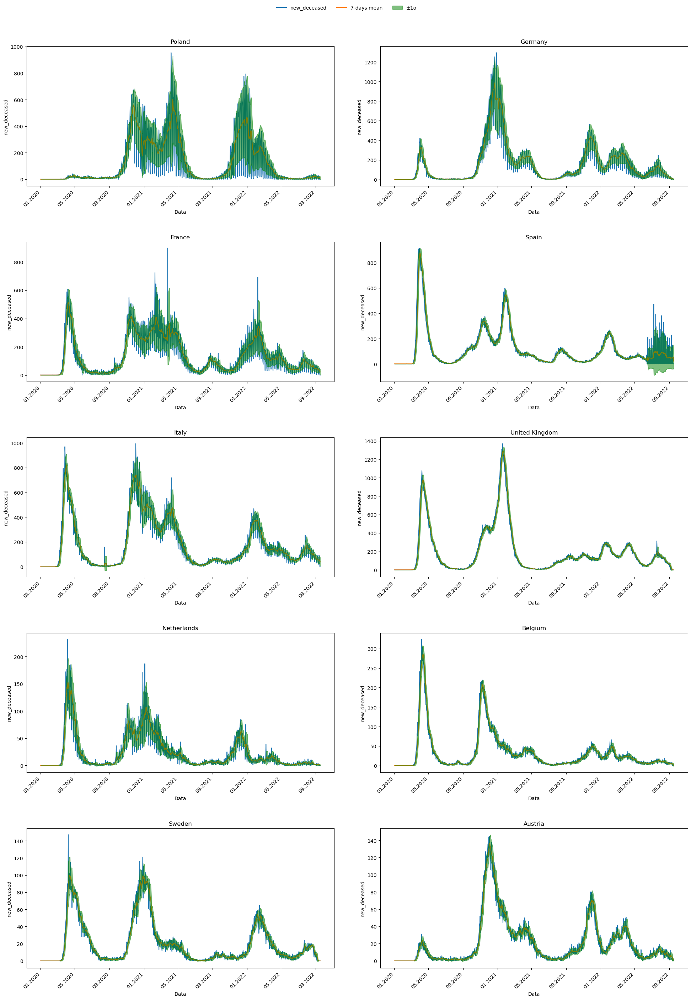

In [8]:
fig, axes = plt.subplots(
    5, 2,
    figsize=(24, 32),
    gridspec_kw={'hspace': 0.4, 'wspace': 0.15}
)

for ax, iso in zip(axes.flat, countries):
    plot_country(
        ax, df, iso,
        base_col='new_deceased',
        mean_col='new_deceased_rolling_mean',
        std_col='new_deceased_rolling_std',
        window_size=window_size
    )

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, frameon=False, bbox_to_anchor=(0.5, 0.96))
fig.subplots_adjust(top=0.92)
plt.show()


1.3 Moving average and moving standard deviation for the number of new vaccinations

In [9]:
df['new_vaccine_doses_administered_rolling_mean'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_vaccine_doses_administered']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).mean())
)

df['new_vaccine_doses_administered_rolling_std'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_vaccine_doses_administered']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).std())
)
display(df.head())


,location_key,iso_3166_1_alpha_3,country_name,new_confirmed,cumulative_confirmed,new_tested,cumulative_tested,new_recovered,cumulative_recovered,new_deceased,...,median_salary,average_salary,lowest_salary,highest_salary,new_confirmed_rolling_mean,new_confirmed_rolling_std,new_deceased_rolling_mean,new_deceased_rolling_std,new_vaccine_doses_administered_rolling_mean,new_vaccine_doses_administered_rolling_std
date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,AW,ABW,Aruba,0,0.0,0,0.0,0,0.0,0,...,1106.15,1268.16,318.44,5642.46,0.0,NaN,0.0,NaN,0.00,NaN
2020-01-02,AW,ABW,Aruba,0,0.0,1,1.0,0,0.0,0,...,1106.15,1268.16,318.44,5642.46,0.0,0.0,0.0,0.0,28.50,40.305087
2020-01-03,AW,ABW,Aruba,0,0.0,1,2.0,0,0.0,0,...,1106.15,1268.16,318.44,5642.46,0.0,0.0,0.0,0.0,38.00,32.908965
2020-01-04,AW,ABW,Aruba,0,0.0,1,3.0,0,0.0,0,...,1106.15,1268.16,318.44,5642.46,0.0,0.0,0.0,0.0,42.75,28.500000
2020-01-05,AW,ABW,Aruba,0,0.0,1,4.0,0,0.0,0,...,1106.15,1268.16,318.44,5642.46,0.0,0.0,0.0,0.0,45.60,25.491175


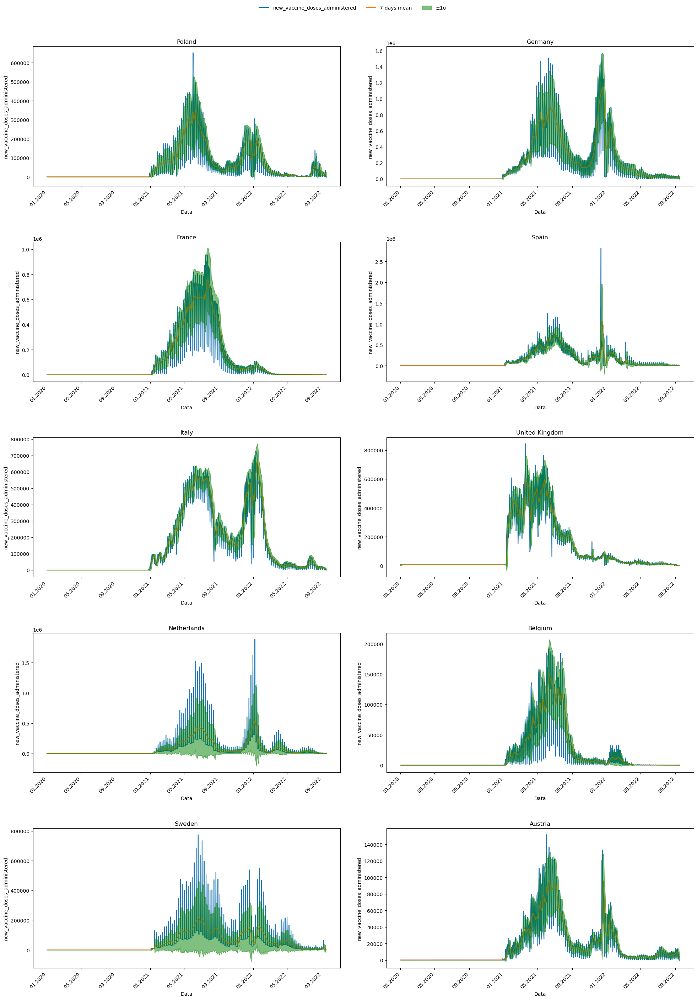

In [10]:
fig, axes = plt.subplots(
    5, 2,
    figsize=(24, 32),
    gridspec_kw={'hspace': 0.4, 'wspace': 0.15}
)

for ax, iso in zip(axes.flat, countries):
    plot_country(
        ax, df, iso,
        base_col='new_vaccine_doses_administered',
        mean_col='new_vaccine_doses_administered_rolling_mean',
        std_col='new_vaccine_doses_administered_rolling_std',
        window_size=window_size
    )

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, frameon=False, bbox_to_anchor=(0.5, 0.96))
fig.subplots_adjust(top=0.92)
plt.show()


1.4.1 Moving average and moving standard deviation for

In [11]:
df['new_tested_rolling_mean'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_tested']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).mean())
)

df['new_tested_rolling_std'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_tested']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).std())
)
display(df.head())

,location_key,iso_3166_1_alpha_3,country_name,new_confirmed,cumulative_confirmed,new_tested,cumulative_tested,new_recovered,cumulative_recovered,new_deceased,...,lowest_salary,highest_salary,new_confirmed_rolling_mean,new_confirmed_rolling_std,new_deceased_rolling_mean,new_deceased_rolling_std,new_vaccine_doses_administered_rolling_mean,new_vaccine_doses_administered_rolling_std,new_tested_rolling_mean,new_tested_rolling_std
date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,AW,ABW,Aruba,0,0.0,0,0.0,0,0.0,0,...,318.44,5642.46,0.0,NaN,0.0,NaN,0.00,NaN,0.000000,NaN
2020-01-02,AW,ABW,Aruba,0,0.0,1,1.0,0,0.0,0,...,318.44,5642.46,0.0,0.0,0.0,0.0,28.50,40.305087,0.500000,0.707107
2020-01-03,AW,ABW,Aruba,0,0.0,1,2.0,0,0.0,0,...,318.44,5642.46,0.0,0.0,0.0,0.0,38.00,32.908965,0.666667,0.577350
2020-01-04,AW,ABW,Aruba,0,0.0,1,3.0,0,0.0,0,...,318.44,5642.46,0.0,0.0,0.0,0.0,42.75,28.500000,0.750000,0.500000
2020-01-05,AW,ABW,Aruba,0,0.0,1,4.0,0,0.0,0,...,318.44,5642.46,0.0,0.0,0.0,0.0,45.60,25.491175,0.800000,0.447214


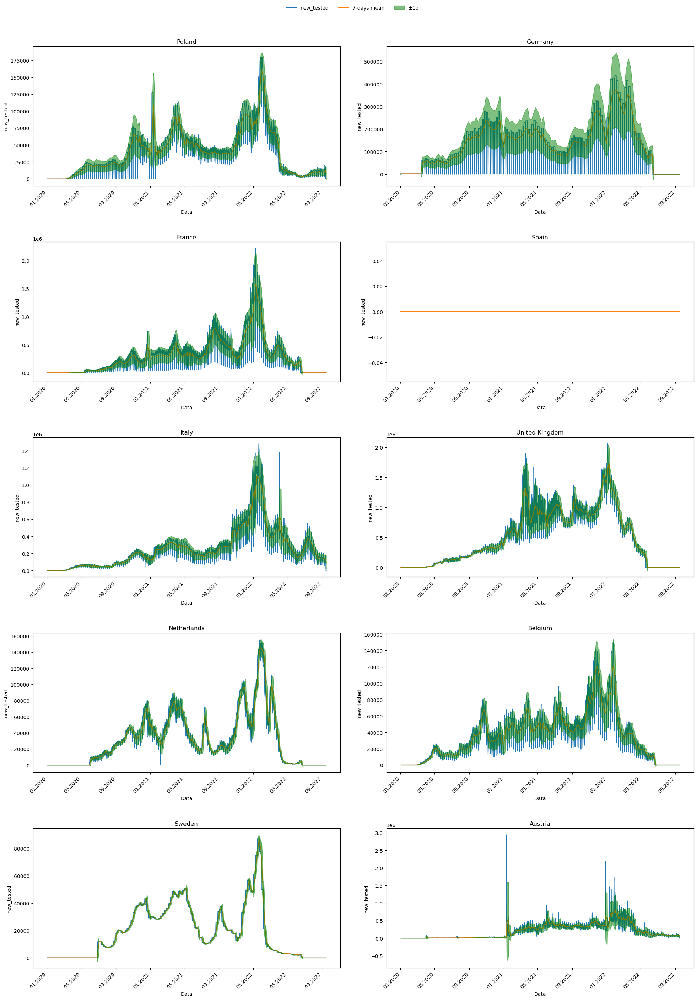

In [12]:
fig, axes = plt.subplots(
    5, 2,
    figsize=(24, 32),
    gridspec_kw={'hspace': 0.4, 'wspace': 0.15}
)

for ax, iso in zip(axes.flat, countries):
    plot_country(
        ax, df, iso,
        base_col='new_tested',
        mean_col='new_tested_rolling_mean',
        std_col='new_tested_rolling_std',
        window_size=window_size
    )

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, frameon=False, bbox_to_anchor=(0.5, 0.96))
fig.subplots_adjust(top=0.92)
plt.show()


1.4.2 Moving average and moving standard deviation for

In [13]:
df['new_recovered_rolling_mean'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_recovered']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).mean())
)

df['new_recovered_rolling_std'] = (
    df
    .groupby('iso_3166_1_alpha_3')['new_recovered']
    .transform(lambda x: x.rolling(window=window_size, min_periods=1).std())
)
display(df.head())

,location_key,iso_3166_1_alpha_3,country_name,new_confirmed,cumulative_confirmed,new_tested,cumulative_tested,new_recovered,cumulative_recovered,new_deceased,...,new_confirmed_rolling_mean,new_confirmed_rolling_std,new_deceased_rolling_mean,new_deceased_rolling_std,new_vaccine_doses_administered_rolling_mean,new_vaccine_doses_administered_rolling_std,new_tested_rolling_mean,new_tested_rolling_std,new_recovered_rolling_mean,new_recovered_rolling_std
date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,AW,ABW,Aruba,0,0.0,0,0.0,0,0.0,0,...,0.0,NaN,0.0,NaN,0.00,NaN,0.000000,NaN,0.0,NaN
2020-01-02,AW,ABW,Aruba,0,0.0,1,1.0,0,0.0,0,...,0.0,0.0,0.0,0.0,28.50,40.305087,0.500000,0.707107,0.0,0.0
2020-01-03,AW,ABW,Aruba,0,0.0,1,2.0,0,0.0,0,...,0.0,0.0,0.0,0.0,38.00,32.908965,0.666667,0.577350,0.0,0.0
2020-01-04,AW,ABW,Aruba,0,0.0,1,3.0,0,0.0,0,...,0.0,0.0,0.0,0.0,42.75,28.500000,0.750000,0.500000,0.0,0.0
2020-01-05,AW,ABW,Aruba,0,0.0,1,4.0,0,0.0,0,...,0.0,0.0,0.0,0.0,45.60,25.491175,0.800000,0.447214,0.0,0.0


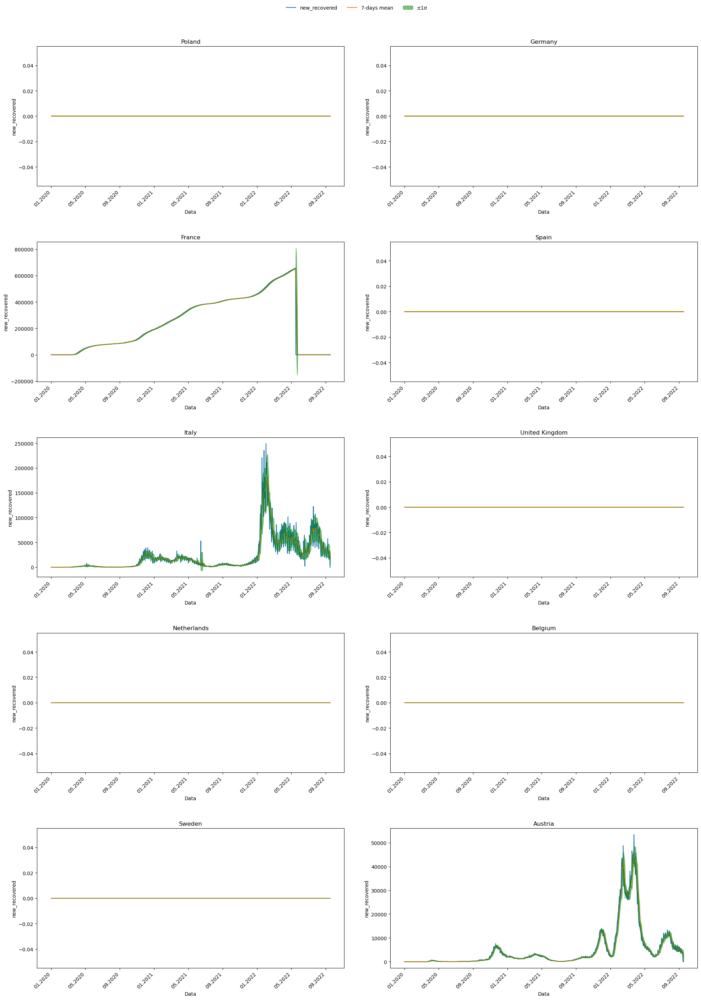

In [14]:
fig, axes = plt.subplots(
    5, 2,
    figsize=(24, 32),
    gridspec_kw={'hspace': 0.4, 'wspace': 0.15}
)

for ax, iso in zip(axes.flat, countries):
    plot_country(
        ax, df, iso,
        base_col='new_recovered',
        mean_col='new_recovered_rolling_mean',
        std_col='new_recovered_rolling_std',
        window_size=window_size
    )

handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, frameon=False, bbox_to_anchor=(0.5, 0.96))
fig.subplots_adjust(top=0.92)
plt.show()


2. Time series

2.1 new confirmed

Arima

In [15]:
series_confirmed = df[df['iso_3166_1_alpha_3'] == 'POL']['new_confirmed']

# Model ARIMA(p, d, q)
model = ARIMA(series_confirmed, order=(5, 1, 2))  # p=autoregresja, d=różnicowanie, q=średnia ruchoma
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
print(forecast)


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


2022-09-18    4371.400837
2022-09-19    6376.573860
2022-09-20    2755.629813
2022-09-21      38.600955
2022-09-22     689.903432
2022-09-23     698.314739
2022-09-24    1124.962026
2022-09-25    3960.390455
2022-09-26    4905.409212
2022-09-27    2184.467831
2022-09-28     480.195301
2022-09-29    1090.537128
2022-09-30    1266.036116
2022-10-01    1722.711003
2022-10-02    3557.454033
2022-10-03    3882.758626
2022-10-04    1902.011528
2022-10-05     864.626230
2022-10-06    1411.873487
2022-10-07    1639.992749
2022-10-08    2037.353498
2022-10-09    3191.187075
2022-10-10    3197.125798
2022-10-11    1786.042298
2022-10-12    1184.142056
2022-10-13    1652.824919
2022-10-14    1875.187144
2022-10-15    2184.201123
2022-10-16    2887.045067
2022-10-17    2748.434824
Freq: D, Name: predicted_mean, dtype: float64


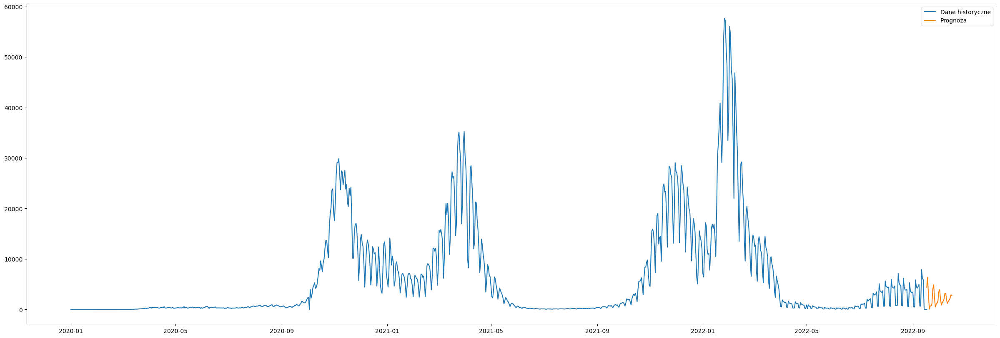

In [16]:
plt.figure(figsize=(30, 10))
plt.plot(series_confirmed.index, series_confirmed, label='Dane historyczne')
plt.plot(pd.date_range(series_confirmed.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


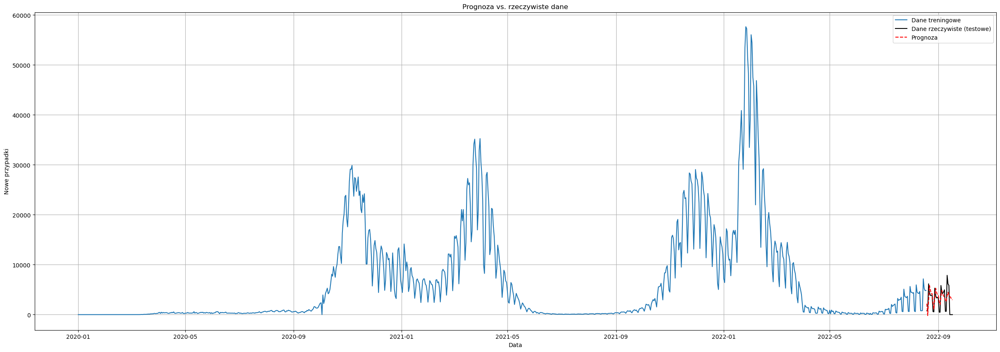

In [17]:
# Podział danych
train = series_confirmed.iloc[:-30]  # wszystkie prócz ostatnich 30 dni
test = series_confirmed.iloc[-30:]   # ostatnie 30 dni

# Uczenie modelu na danych treningowych
model = ARIMA(train, order=(5, 1, 2))  # (p,d,q)
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza', linestyle='--', color='red')
plt.title('Prognoza vs. rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe przypadki')
plt.legend()
plt.grid(True)
plt.show()


2.2 new deceased

In [18]:
series_deceased = df[df['iso_3166_1_alpha_3'] == 'POL']['new_deceased']

# Model ARIMA(p, d, q)
model = ARIMA(series_deceased, order=(5, 1, 2))  # p=autoregresja, d=różnicowanie, q=średnia ruchoma
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
print(forecast)


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA par

2022-09-18     5.573054
2022-09-19    15.654037
2022-09-20    21.887355
2022-09-21    13.920160
2022-09-22     3.093669
2022-09-23    -0.831567
2022-09-24     0.901213
2022-09-25     6.562497
2022-09-26    15.590580
2022-09-27    19.656668
2022-09-28    13.397733
2022-09-29     3.930406
2022-09-30    -0.299957
2022-10-01     1.383291
2022-10-02     7.430339
2022-10-03    15.194922
2022-10-04    18.137360
2022-10-05    12.778761
2022-10-06     4.503804
2022-10-07     0.320492
2022-10-08     1.991396
2022-10-09     7.976034
2022-10-10    14.775198
2022-10-11    16.947626
2022-10-12    12.208392
2022-10-13     4.893628
2022-10-14     0.977842
2022-10-15     2.622051
2022-10-16     8.342202
2022-10-17    14.345456
Freq: D, Name: predicted_mean, dtype: float64


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


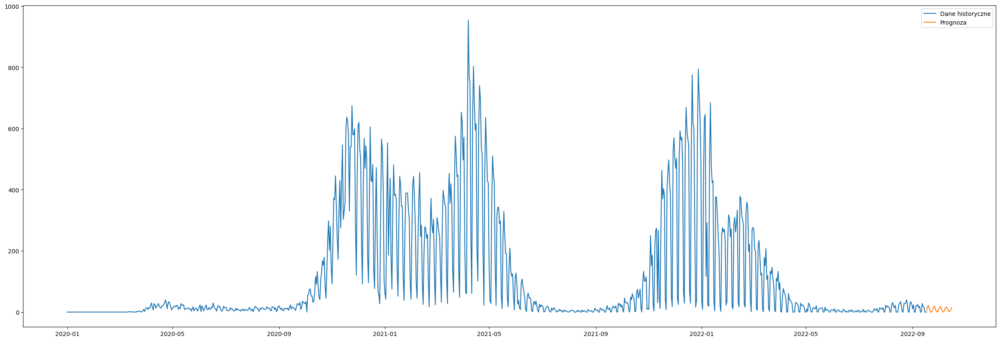

In [19]:
plt.figure(figsize=(30, 10))
plt.plot(series_deceased.index, series_deceased, label='Dane historyczne')
plt.plot(pd.date_range(series_deceased.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA par

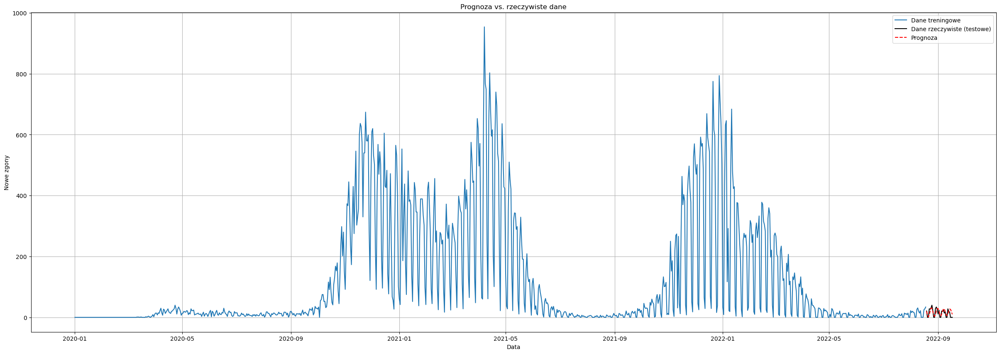

In [20]:
# Podział danych
train = series_deceased.iloc[:-30]  # wszystkie prócz ostatnich 30 dni
test = series_deceased.iloc[-30:]   # ostatnie 30 dni

# Uczenie modelu na danych treningowych
model = ARIMA(train, order=(5, 1, 2))  # (p,d,q)
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza', linestyle='--', color='red')
plt.title('Prognoza vs. rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe zgony')
plt.legend()
plt.grid(True)
plt.show()


2.3 new vaccines

In [21]:
# Dane czasowe
series_vaccines = df[df['iso_3166_1_alpha_3'] == 'POL']['new_vaccine_doses_administered']

# Model ARIMA(p, d, q)
model = ARIMA(series_vaccines, order=(5, 1, 2))  # p=autoregresja, d=różnicowanie, q=średnia ruchoma
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
print(forecast)


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA par

2022-09-18    -7083.313320
2022-09-19     2591.757941
2022-09-20    25482.636620
2022-09-21    24622.985104
2022-09-22     9156.748207
2022-09-23       61.023392
2022-09-24    -4376.005397
2022-09-25    -5124.920829
2022-09-26     6915.285984
2022-09-27    21646.346583
2022-09-28    22276.918086
2022-09-29    11376.936482
2022-09-30      504.639239
2022-10-01    -5690.630240
2022-10-02    -3509.720594
2022-10-03     8172.273643
2022-10-04    19915.925483
2022-10-05    20980.944157
2022-10-06    11959.199728
2022-10-07      704.588240
2022-10-08    -5590.583578
2022-10-09    -2459.235453
2022-10-10     8609.240871
2022-10-11    18893.403107
2022-10-12    20079.714337
2022-10-13    11910.820534
2022-10-14      925.755067
2022-10-15    -5065.756761
2022-10-16    -1663.692270
2022-10-17     8771.777073
Freq: D, Name: predicted_mean, dtype: float64


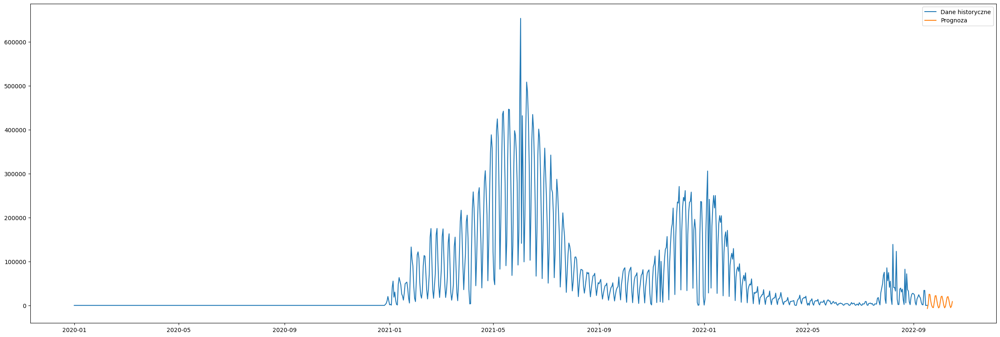

In [22]:
plt.figure(figsize=(30, 10))
plt.plot(series_vaccines.index, series_vaccines, label='Dane historyczne')
plt.plot(pd.date_range(series_vaccines.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA par

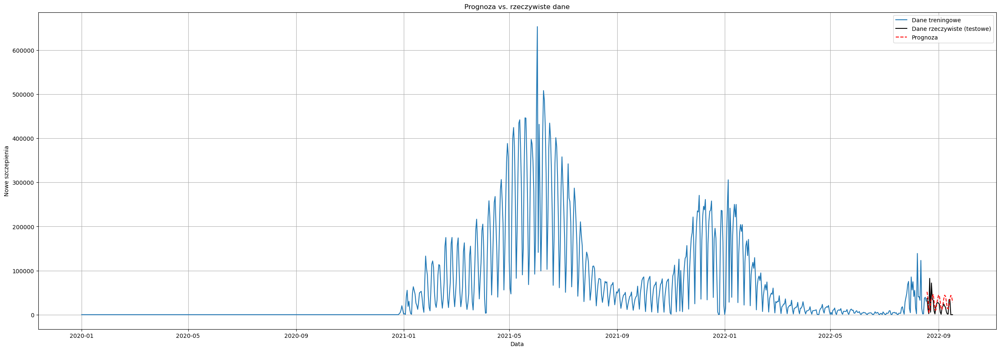

In [23]:
# Podział danych
train = series_vaccines.iloc[:-30]  # wszystkie prócz ostatnich 30 dni
test = series_vaccines.iloc[-30:]   # ostatnie 30 dni

# Uczenie modelu na danych treningowych
model = ARIMA(train, order=(5, 1, 2))  # (p,d,q)
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza', linestyle='--', color='red')
plt.title('Prognoza vs. rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe szczepienia')
plt.legend()
plt.grid(True)
plt.show()


2.4.1 new tested

In [24]:
# Dane czasowe
series_tests = df[df['iso_3166_1_alpha_3'] == 'POL']['new_tested']

# Model ARIMA(p, d, q)
model = ARIMA(series_tests, order=(5, 1, 2))  # p=autoregresja, d=różnicowanie, q=średnia ruchoma
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
print(forecast)

C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA par

2022-09-18     1453.669562
2022-09-19     9129.678762
2022-09-20    17792.993854
2022-09-21    12384.168579
2022-09-22     3048.137076
2022-09-23      -76.017537
2022-09-24     1023.217071
2022-09-25     3568.119239
2022-09-26    10090.302118
2022-09-27    14374.603271
2022-09-28    10544.329514
2022-09-29     3697.094405
2022-09-30      950.348457
2022-10-01     1881.537073
2022-10-02     5154.578222
2022-10-03     9995.707709
2022-10-04    12289.023913
2022-10-05     9111.415374
2022-10-06     4099.577688
2022-10-07     1849.247300
2022-10-08     2896.842601
2022-10-09     6055.882255
2022-10-10     9671.565672
2022-10-11    10781.424280
2022-10-12     8121.383978
2022-10-13     4348.169874
2022-10-14     2685.466343
2022-10-15     3790.794404
2022-10-16     6586.942553
2022-10-17     9245.615589
Freq: D, Name: predicted_mean, dtype: float64


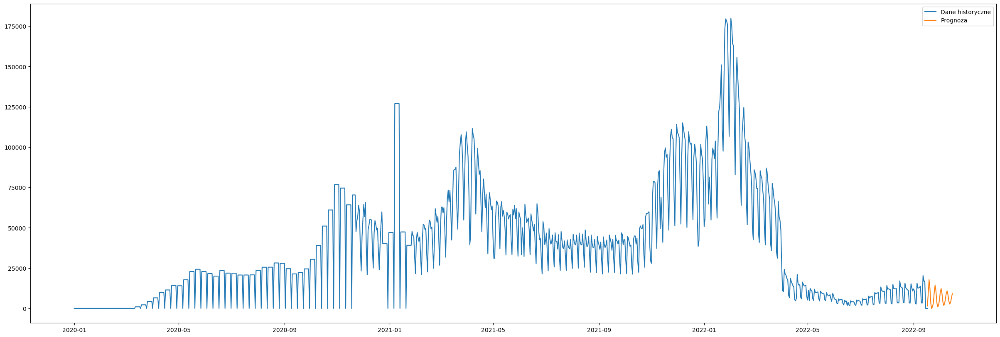

In [25]:
plt.figure(figsize=(30, 10))
plt.plot(series_tests.index, series_tests, label='Dane historyczne')
plt.plot(pd.date_range(series_tests.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA par

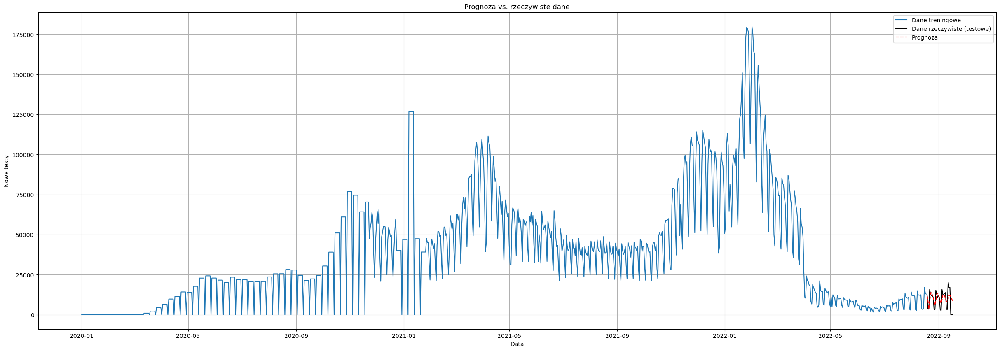

In [26]:
# Podział danych
train = series_tests.iloc[:-30]  # wszystkie prócz ostatnich 30 dni
test = series_tests.iloc[-30:]   # ostatnie 30 dni

# Uczenie modelu na danych treningowych
model = ARIMA(train, order=(5, 1, 2))  # (p,d,q)
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza', linestyle='--', color='red')
plt.title('Prognoza vs. rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe testy')
plt.legend()
plt.grid(True)
plt.show()


2.4.2 new recovered

In [27]:
# Dane czasowe
series_recovered = df[df['iso_3166_1_alpha_3'] == 'POL']['new_recovered']

# Model ARIMA(p, d, q)
model = ARIMA(series_recovered, order=(5, 1, 2))  # p=autoregresja, d=różnicowanie, q=średnia ruchoma
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
print(forecast)

C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


2022-09-18    0.0
2022-09-19    0.0
2022-09-20    0.0
2022-09-21    0.0
2022-09-22    0.0
2022-09-23    0.0
2022-09-24    0.0
2022-09-25    0.0
2022-09-26    0.0
2022-09-27    0.0
2022-09-28    0.0
2022-09-29    0.0
2022-09-30    0.0
2022-10-01    0.0
2022-10-02    0.0
2022-10-03    0.0
2022-10-04    0.0
2022-10-05    0.0
2022-10-06    0.0
2022-10-07    0.0
2022-10-08    0.0
2022-10-09    0.0
2022-10-10    0.0
2022-10-11    0.0
2022-10-12    0.0
2022-10-13    0.0
2022-10-14    0.0
2022-10-15    0.0
2022-10-16    0.0
2022-10-17    0.0
Freq: D, Name: predicted_mean, dtype: float64


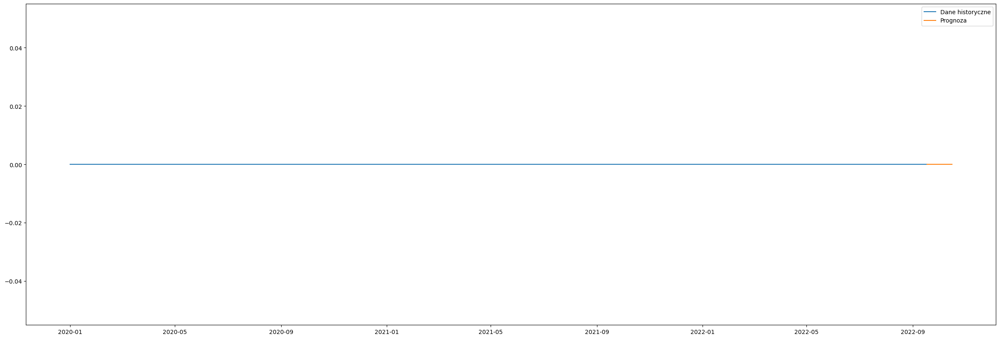

In [28]:
plt.figure(figsize=(30, 10))
plt.plot(series_recovered.index, series_recovered, label='Dane historyczne')
plt.plot(pd.date_range(series_recovered.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


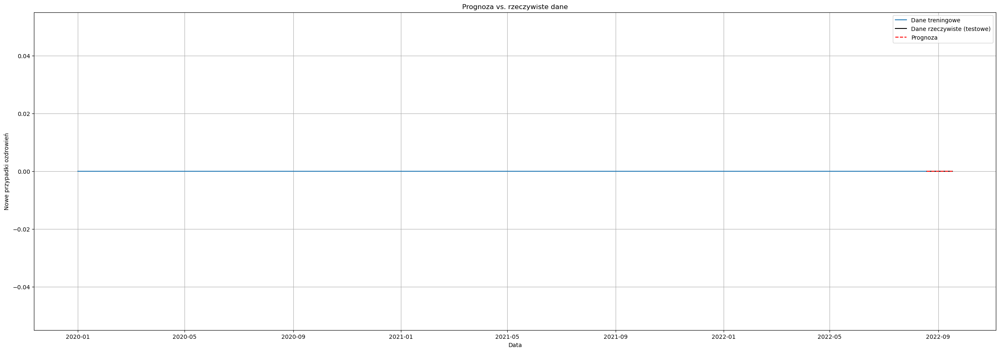

In [29]:
# Podział danych
train = series_recovered.iloc[:-30]  # wszystkie prócz ostatnich 30 dni
test = series_recovered.iloc[-30:]   # ostatnie 30 dni

# Uczenie modelu na danych treningowych
model = ARIMA(train, order=(5, 1, 2)) # (p,d,q)
model_fit = model.fit()

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza', linestyle='--', color='red')
plt.title('Prognoza vs. rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe przypadki ozdrowień')
plt.legend()
plt.grid(True)
plt.show()


Sarima

In [30]:
model = SARIMAX(
    series_confirmed,
    order=(1, 1, 1), # (p,d,q)
    seasonal_order=(1, 1, 1, 30) # (P,D,Q,s) s=sezonowość
)
model_fit = model.fit()

forecast = model_fit.forecast(steps=30)
print(forecast)

C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2022-09-18    2097.569500
2022-09-19    1710.407917
2022-09-20     157.181139
2022-09-21     517.203768
2022-09-22    1271.512339
2022-09-23    1378.612654
2022-09-24    1311.335880
2022-09-25    2005.679539
2022-09-26    1841.224267
2022-09-27     -97.171034
2022-09-28     189.053496
2022-09-29    1767.359921
2022-09-30    1952.846803
2022-10-01    1317.914324
2022-10-02    1958.153538
2022-10-03    1497.406400
2022-10-04    -107.494576
2022-10-05     958.658187
2022-10-06    1201.750140
2022-10-07     445.633905
2022-10-08      -3.215608
2022-10-09    1158.317485
2022-10-10     812.039945
2022-10-11    -327.525067
2022-10-12      80.351078
2022-10-13    -173.184482
2022-10-14    1001.401126
2022-10-15    1173.335600
2022-10-16    1637.460390
2022-10-17    1491.355735
Freq: D, Name: predicted_mean, dtype: float64


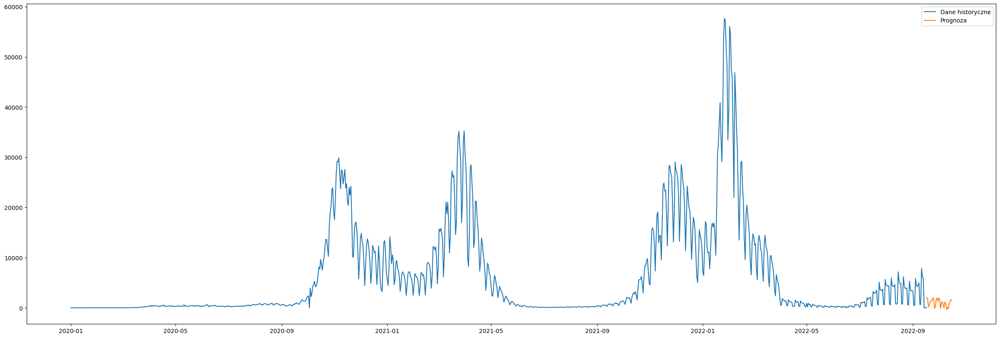

In [31]:
plt.figure(figsize=(30, 10))
plt.plot(series_confirmed.index, series_confirmed, label='Dane historyczne')
plt.plot(pd.date_range(series_confirmed.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


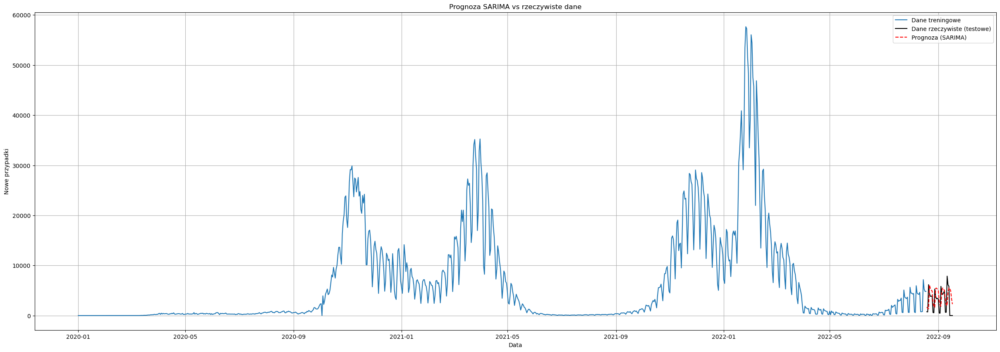

In [32]:
# Podział danych
train = series_confirmed.iloc[:-30]
test = series_confirmed.iloc[-30:]

# Budowa modelu SARIMA
model = SARIMAX(
    train,
    order=(2, 1, 2), # (p,d,q)
    seasonal_order=(1, 1, 1, 7), # (P,D,Q,s) - sezonowość tygodniowa
    enforce_stationarity=False,
    enforce_invertibility=False
)
model_fit = model.fit(disp=False)

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza (SARIMA)', linestyle='--', color='red')
plt.title('Prognoza SARIMA vs rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe przypadki')
plt.legend()
plt.grid(True)
plt.show()


2.2 new deceased

In [33]:
model = SARIMAX(
    series_deceased,
    order=(1, 1, 1), # (p,d,q)
    seasonal_order=(1, 1, 1, 30) # (P,D,Q,s) s=sezonowość
)
model_fit = model.fit()

forecast = model_fit.forecast(steps=30)
print(forecast)


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


2022-09-18    13.989319
2022-09-19    26.382120
2022-09-20    14.910769
2022-09-21     5.162397
2022-09-22   -13.257341
2022-09-23   -13.309029
2022-09-24     1.182530
2022-09-25    11.330545
2022-09-26    23.059084
2022-09-27    -9.305719
2022-09-28     2.504778
2022-09-29    25.561569
2022-09-30     1.793353
2022-10-01    10.703760
2022-10-02    19.469805
2022-10-03     2.013036
2022-10-04    15.686136
2022-10-05    14.112208
2022-10-06    19.870503
2022-10-07   -14.553943
2022-10-08     9.487259
2022-10-09    24.583196
2022-10-10    15.053225
2022-10-11    21.070450
2022-10-12    17.442663
2022-10-13    30.300435
2022-10-14     0.067610
2022-10-15    -4.204335
2022-10-16     1.484804
2022-10-17     3.896304
Freq: D, Name: predicted_mean, dtype: float64


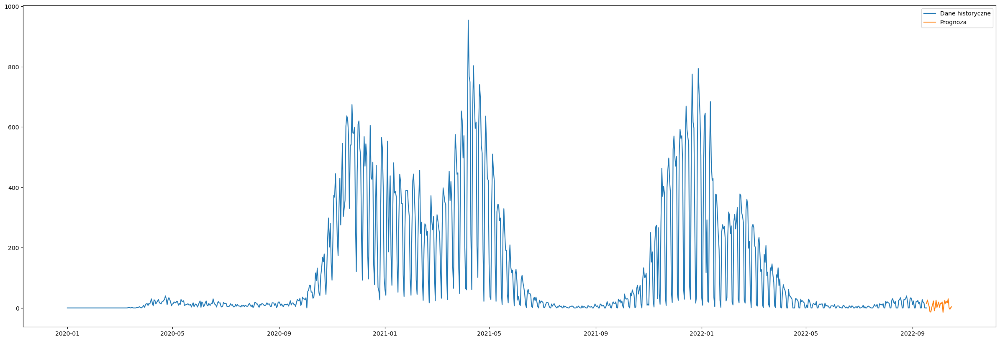

In [34]:
plt.figure(figsize=(30, 10))
plt.plot(series_deceased.index, series_deceased, label='Dane historyczne')
plt.plot(pd.date_range(series_deceased.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


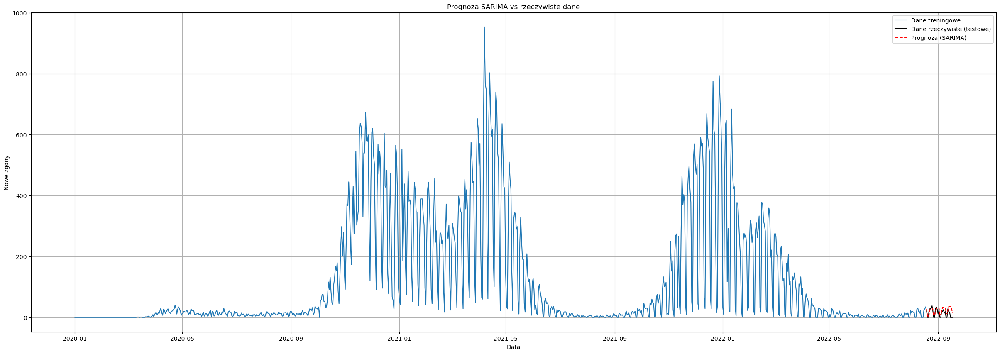

In [35]:
# Podział danych
train = series_deceased.iloc[:-30]
test = series_deceased.iloc[-30:]

# Budowa modelu SARIMA
model = SARIMAX(
    train,
    order=(2, 1, 2), # (p,d,q)
    seasonal_order=(1, 1, 1, 7), # (P,D,Q,s) - sezonowość tygodniowa
    enforce_stationarity=False,
    enforce_invertibility=False
)
model_fit = model.fit(disp=False)

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza (SARIMA)', linestyle='--', color='red')
plt.title('Prognoza SARIMA vs rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe zgony')
plt.legend()
plt.grid(True)
plt.show()


2.3 new vaccinations

In [36]:
model = SARIMAX(
    series_vaccines,
    order=(1, 1, 1), # (p,d,q)
    seasonal_order=(1, 1, 1, 30)  # (P,D,Q,s) s=sezonowość
)
model_fit = model.fit()

forecast = model_fit.forecast(steps=30)
print(forecast)


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


2022-09-18     5722.803426
2022-09-19     6244.617784
2022-09-20    -1875.496964
2022-09-21      506.525404
2022-09-22    10836.780309
2022-09-23    11897.403841
2022-09-24    17571.966651
2022-09-25    23840.826904
2022-09-26    13155.299339
2022-09-27     8379.972909
2022-09-28     4276.520331
2022-09-29     7229.356096
2022-09-30    23252.992091
2022-10-01    16496.233029
2022-10-02    30129.620497
2022-10-03    12887.624931
2022-10-04    20583.337971
2022-10-05    16134.060585
2022-10-06     7555.654417
2022-10-07    22835.378804
2022-10-08     9828.923801
2022-10-09    16308.232139
2022-10-10    15930.168495
2022-10-11    25042.055573
2022-10-12    12195.723331
2022-10-13     1083.443620
2022-10-14     6644.765593
2022-10-15     8407.511647
2022-10-16    15677.677734
2022-10-17    12811.039280
Freq: D, Name: predicted_mean, dtype: float64


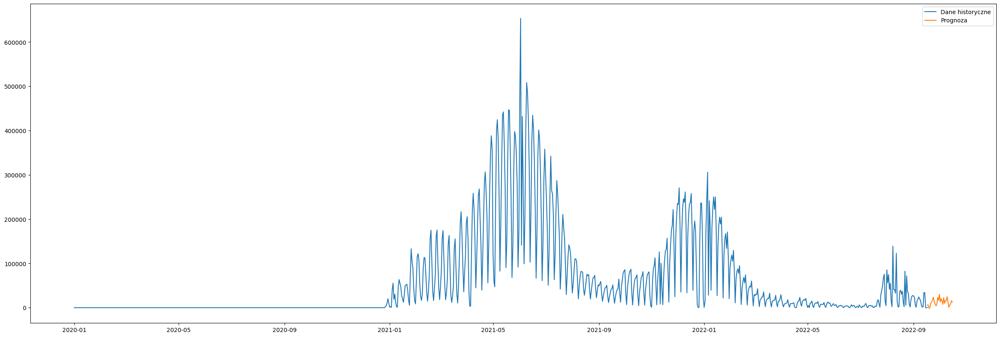

In [37]:
plt.figure(figsize=(30, 10))
plt.plot(series_vaccines.index, series_vaccines, label='Dane historyczne')
plt.plot(pd.date_range(series_vaccines.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


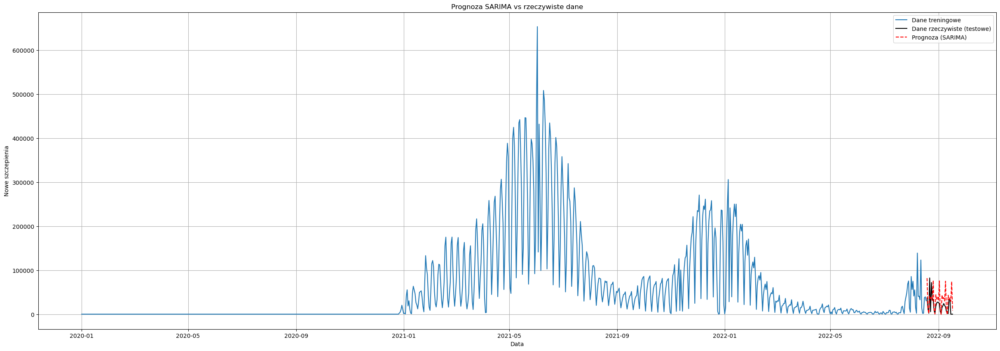

In [38]:
# Podział danych
train = series_vaccines.iloc[:-30]
test = series_vaccines.iloc[-30:]

# Budowa modelu SARIMA
model = SARIMAX(
    train,
    order=(2, 1, 2), # (p,d,q)
    seasonal_order=(1, 1, 1, 7), # (P,D,Q,s) - sezonowość tygodniowa
    enforce_stationarity=False,
    enforce_invertibility=False
)
model_fit = model.fit(disp=False)

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza (SARIMA)', linestyle='--', color='red')
plt.title('Prognoza SARIMA vs rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe szczepienia')
plt.legend()
plt.grid(True)
plt.show()


2.4.1 new tested

In [39]:
model = SARIMAX(
    series_tests,
    order=(1, 1, 1), # (p,d,q)
    seasonal_order=(1, 1, 1, 30) # (P,D,Q,s) s=sezonowość
)
model_fit = model.fit()

forecast = model_fit.forecast(steps=30)
print(forecast)


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


2022-09-18    4349.745000
2022-09-19    7721.672147
2022-09-20    5769.105627
2022-09-21    4367.844322
2022-09-22    6679.906158
2022-09-23    8096.618123
2022-09-24    8260.911494
2022-09-25    6547.871085
2022-09-26    8452.361401
2022-09-27    3737.143749
2022-09-28    2699.348284
2022-09-29    6722.453048
2022-09-30    8916.423529
2022-10-01    7053.125400
2022-10-02    6275.003047
2022-10-03    5492.111238
2022-10-04    4077.373504
2022-10-05    3502.122878
2022-10-06    3864.727652
2022-10-07    3061.984254
2022-10-08    1953.809826
2022-10-09    1544.419132
2022-10-10    3790.013876
2022-10-11    2668.032717
2022-10-12     788.780373
2022-10-13    1414.488825
2022-10-14    1742.758359
2022-10-15    3363.380912
2022-10-16    5090.824496
2022-10-17    4936.667932
Freq: D, Name: predicted_mean, dtype: float64


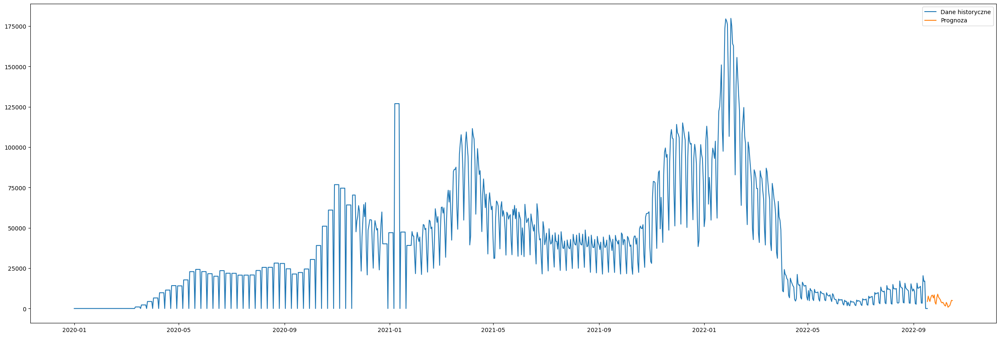

In [40]:
plt.figure(figsize=(30, 10))
plt.plot(series_tests.index, series_tests, label='Dane historyczne')
plt.plot(pd.date_range(series_tests.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


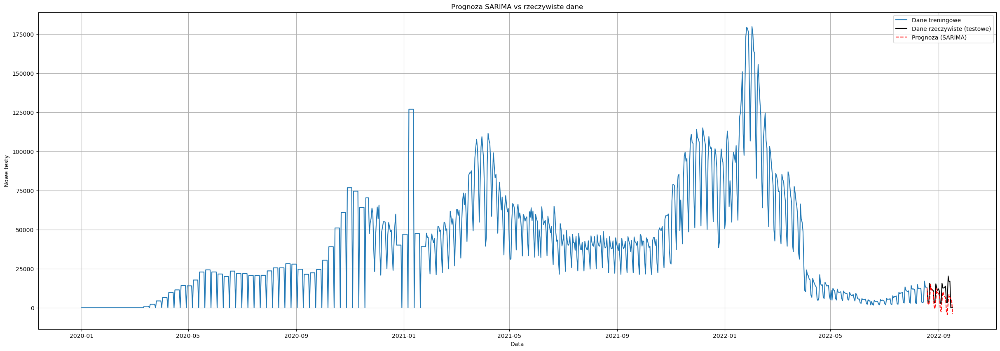

In [41]:
# Podział danych
train = series_tests.iloc[:-30]
test = series_tests.iloc[-30:]

# Budowa modelu SARIMA
model = SARIMAX(
    train,
    order=(2, 1, 2), # (p,d,q)
    seasonal_order=(1, 1, 1, 7), # (P,D,Q,s) - sezonowość tygodniowa
    enforce_stationarity=False,
    enforce_invertibility=False
)
model_fit = model.fit(disp=False)

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza (SARIMA)', linestyle='--', color='red')
plt.title('Prognoza SARIMA vs rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe testy')
plt.legend()
plt.grid(True)
plt.show()


2.4.2 new recovered

In [42]:
model = SARIMAX(
    series_recovered,
    order=(1, 1, 1), # (p,d,q)
    seasonal_order=(1, 1, 1, 30) # (P,D,Q,s) s=sezonowość
)
model_fit = model.fit()

forecast = model_fit.forecast(steps=30)
print(forecast)


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2022-09-18    0.0
2022-09-19    0.0
2022-09-20    0.0
2022-09-21    0.0
2022-09-22    0.0
2022-09-23    0.0
2022-09-24    0.0
2022-09-25    0.0
2022-09-26    0.0
2022-09-27    0.0
2022-09-28    0.0
2022-09-29    0.0
2022-09-30    0.0
2022-10-01    0.0
2022-10-02    0.0
2022-10-03    0.0
2022-10-04    0.0
2022-10-05    0.0
2022-10-06    0.0
2022-10-07    0.0
2022-10-08    0.0
2022-10-09    0.0
2022-10-10    0.0
2022-10-11    0.0
2022-10-12    0.0
2022-10-13    0.0
2022-10-14    0.0
2022-10-15    0.0
2022-10-16    0.0
2022-10-17    0.0
Freq: D, Name: predicted_mean, dtype: float64


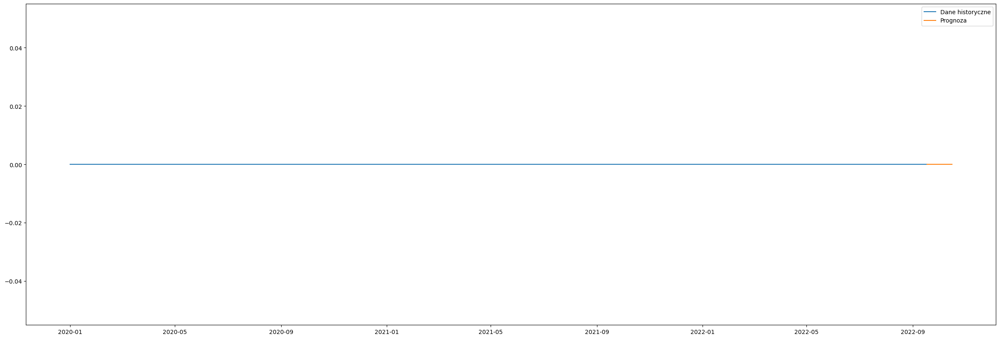

In [43]:
plt.figure(figsize=(30, 10))
plt.plot(series_recovered.index, series_recovered, label='Dane historyczne')
plt.plot(pd.date_range(series_recovered.index[-1], periods=30, freq='D'), forecast, label='Prognoza')
plt.legend()
plt.show()


C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\Piotr\miniconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


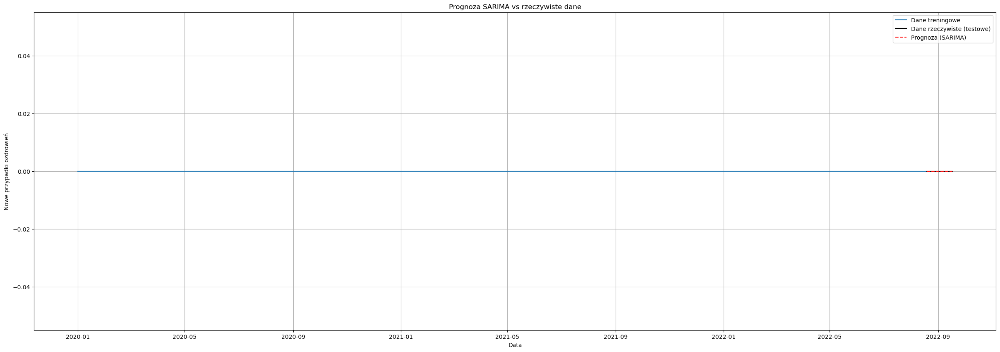

In [44]:
# Podział danych
train = series_recovered.iloc[:-30]
test = series_recovered.iloc[-30:]

# Budowa modelu SARIMA
model = SARIMAX(
    train,
    order=(2, 1, 2), # (p,d,q)
    seasonal_order=(1, 1, 1, 7), # (P,D,Q,s) - sezonowość tygodniowa
    enforce_stationarity=False,
    enforce_invertibility=False
)
model_fit = model.fit(disp=False)

# Prognoza
forecast = model_fit.forecast(steps=30)
forecast.index = test.index

# Wykres
plt.figure(figsize=(30, 10))
plt.plot(train.index, train, label='Dane treningowe')
plt.plot(test.index, test, label='Dane rzeczywiste (testowe)', color='black')
plt.plot(forecast.index, forecast, label='Prognoza (SARIMA)', linestyle='--', color='red')
plt.title('Prognoza SARIMA vs rzeczywiste dane')
plt.xlabel('Data')
plt.ylabel('Nowe przypadki ozdrowień')
plt.legend()
plt.grid(True)
plt.show()


3. regression

In [45]:
train_data = df[(df.index >= '2021-01-01') & (df.index <= '2021-12-31') & (df['iso_3166_1_alpha_3'] == 'POL')]
test_data = df[(df.index > '2021-12-31') & (df['iso_3166_1_alpha_3'] == 'POL')]


In [46]:
# Modele regresji
models = {
    "Linear": LinearRegression(),
    "Polynomial (2 deg)": make_pipeline(PolynomialFeatures(2), LinearRegression()),
    "Polynomial (3 deg)": make_pipeline(PolynomialFeatures(3), LinearRegression()),
    "Ridge": Ridge(alpha=1.0),
    "Lasso": Lasso(alpha=0.1, max_iter=10000),
    "SVR (RBF Kernel)": SVR(kernel='rbf', C=1000, epsilon=10)
}


In [47]:
# Funkcja do obliczania metryk dopasowania
def evaluate_model(y_true, y_pred):
    """
    Oblicza metryki dopasowania modelu.
    """
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    residuals = y_true - y_pred
    variance_of_residuals = np.var(residuals)
    std_error_residuals = np.std(residuals)
    cv = std_error_residuals / np.mean(y_true)

    return {
        "MSE": mse,
        "MAE": mae,
        "RMSE": rmse,
        "R2": r2,
        "Variance of Residuals": variance_of_residuals,
        "Std Error of Residuals": std_error_residuals,
        "CV": cv
    }


new confirmed

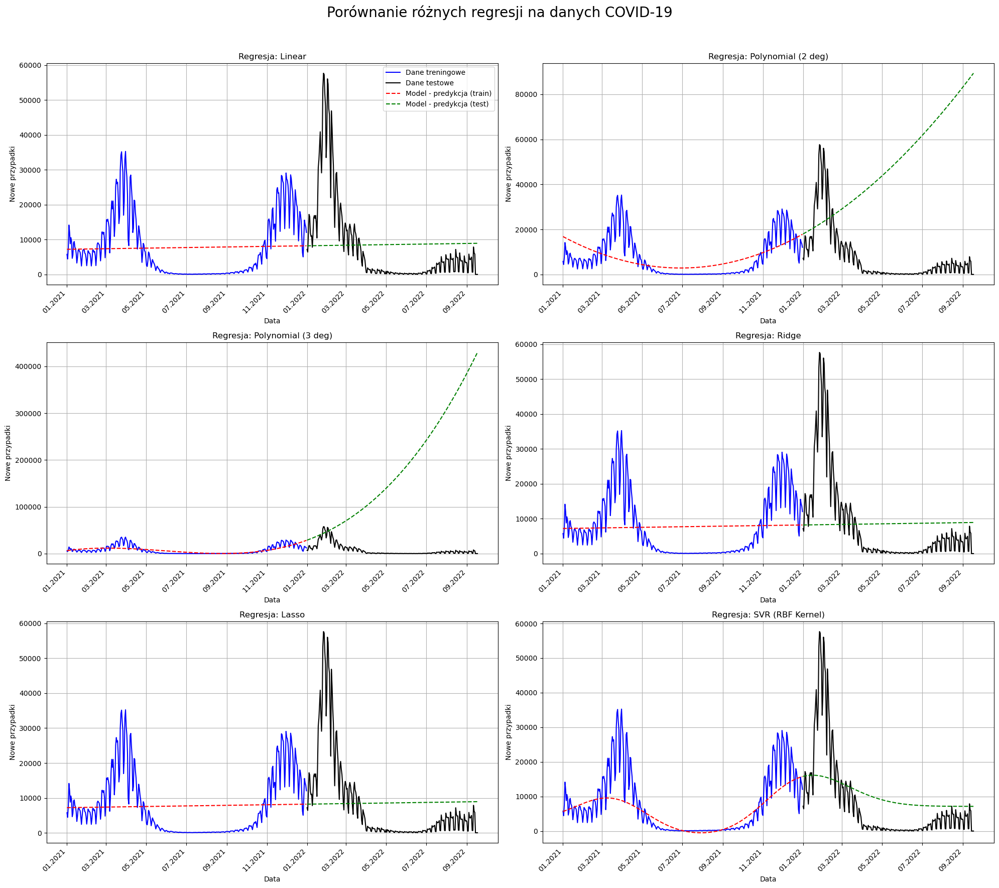

In [48]:
train_df = train_data['new_confirmed']
test_df = test_data['new_confirmed']

# Przygotowanie X i y
X_train = mdates.date2num(train_df.index).reshape(-1, 1)
y_train = train_df.values

X_test = mdates.date2num(test_df.index).reshape(-1, 1)
y_test = test_df.values

predictions = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    predictions[name] = (y_pred_train, y_pred_test)

# Wykres
fig, axes = plt.subplots(3, 2, figsize=(20, 18))
axes = axes.flatten()

# Formatowanie dat
locator = mdates.AutoDateLocator()
formatter = mdates.DateFormatter('%m.%Y')

for idx, (name, (y_pred_train, y_pred_test)) in enumerate(predictions.items()):
    ax = axes[idx]

    # Rysowanie danych rzeczywistych
    ax.plot(train_df.index, y_train, label='Dane treningowe', color='blue')
    ax.plot(test_df.index, y_test, label='Dane testowe', color='black')

    # Rysowanie predykcji
    ax.plot(train_df.index, y_pred_train, label='Model - predykcja (train)', linestyle='--', color='red')
    ax.plot(test_df.index, y_pred_test, label='Model - predykcja (test)', linestyle='--', color='green')

    ax.set_title(f'Regresja: {name}')
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xlabel('Data')
    ax.set_ylabel('Nowe przypadki')

    ax.grid(True)
    if idx == 0:
        ax.legend()

for i in range(len(models), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Porównanie różnych regresji na danych COVID-19', fontsize=20)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [49]:
# Trening i ocena każdego modelu
model_results = {}

for model_name, model in models.items():
    model.fit(X_train, y_train)

    # Predykcja na danych testowych
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Ocena modelu
    train_metrics = evaluate_model(y_train, y_train_pred)
    test_metrics = evaluate_model(y_test, y_test_pred)

    model_results[model_name] = {
        "Train Metrics": train_metrics,
        "Test Metrics": test_metrics
    }

# Wyświetl wyniki dla każdego modelu
for model_name, metrics in model_results.items():
    print(f"Model: {model_name}")
    print("Training Metrics:")
    for metric, value in metrics["Train Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("Test Metrics:")
    for metric, value in metrics["Test Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("-" * 50)


Model: Linear
Training Metrics:
  MSE: 77068878.9014
  MAE: 7116.5130
  RMSE: 8778.8882
  R2: 0.0011
  Variance of Residuals: 77068878.9014
  Std Error of Residuals: 8778.8882
  CV: 1.1391
Test Metrics:
  MSE: 159626896.1617
  MAE: 9141.7715
  RMSE: 12634.3538
  R2: -0.0226
  Variance of Residuals: 159287228.6730
  Std Error of Residuals: 12620.9044
  CV: 1.5812
--------------------------------------------------
Model: Polynomial (2 deg)
Training Metrics:
  MSE: 58271034.3884
  MAE: 5753.4646
  RMSE: 7633.5466
  R2: 0.2447
  Variance of Residuals: 58271034.3884
  Std Error of Residuals: 7633.5466
  CV: 0.9905
Test Metrics:
  MSE: 2549187255.5953
  MAE: 44335.5044
  RMSE: 50489.4767
  R2: -15.3306
  Variance of Residuals: 881726187.3729
  Std Error of Residuals: 29693.8746
  CV: 3.7201
--------------------------------------------------
Model: Polynomial (3 deg)
Training Metrics:
  MSE: 41986502.3460
  MAE: 4413.7379
  RMSE: 6479.6992
  R2: 0.4558
  Variance of Residuals: 41986502.3460
 

new deceased

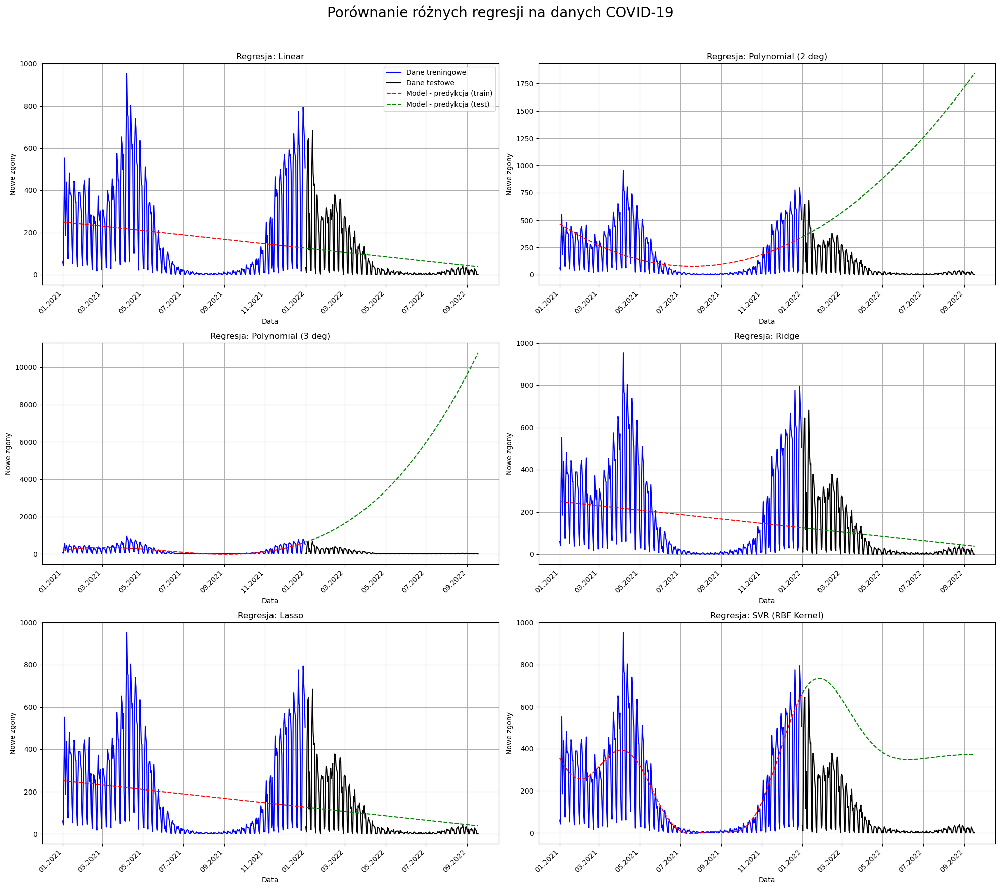

In [50]:
train_df = train_data['new_deceased']
test_df = test_data['new_deceased']

# Przygotowanie X i y
X_train = mdates.date2num(train_df.index).reshape(-1, 1)
y_train = train_df.values

X_test = mdates.date2num(test_df.index).reshape(-1, 1)
y_test = test_df.values

predictions = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    predictions[name] = (y_pred_train, y_pred_test)

# Wykres
fig, axes = plt.subplots(3, 2, figsize=(20, 18))
axes = axes.flatten()

# Formatowanie dat
locator = mdates.AutoDateLocator()
formatter = mdates.DateFormatter('%m.%Y')

for idx, (name, (y_pred_train, y_pred_test)) in enumerate(predictions.items()):
    ax = axes[idx]

    # Rysowanie danych rzeczywistych
    ax.plot(train_df.index, y_train, label='Dane treningowe', color='blue')
    ax.plot(test_df.index, y_test, label='Dane testowe', color='black')

    # Rysowanie predykcji
    ax.plot(train_df.index, y_pred_train, label='Model - predykcja (train)', linestyle='--', color='red')
    ax.plot(test_df.index, y_pred_test, label='Model - predykcja (test)', linestyle='--', color='green')

    ax.set_title(f'Regresja: {name}')
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xlabel('Data')
    ax.set_ylabel('Nowe zgony')

    ax.grid(True)
    if idx == 0:
        ax.legend()

for i in range(len(models), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Porównanie różnych regresji na danych COVID-19', fontsize=20)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [51]:
# Trening i ocena każdego modelu
model_results = {}

for model_name, model in models.items():
    model.fit(X_train, y_train)

    # Predykcja na danych testowych
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Ocena modelu
    train_metrics = evaluate_model(y_train, y_train_pred)
    test_metrics = evaluate_model(y_test, y_test_pred)

    model_results[model_name] = {
        "Train Metrics": train_metrics,
        "Test Metrics": test_metrics
    }

# Wyświetl wyniki dla każdego modelu
for model_name, metrics in model_results.items():
    print(f"Model: {model_name}")
    print("Training Metrics:")
    for metric, value in metrics["Train Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("Test Metrics:")
    for metric, value in metrics["Test Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("-" * 50)

Model: Linear
Training Metrics:
  MSE: 45603.9889
  MAE: 177.5691
  RMSE: 213.5509
  R2: 0.0275
  Variance of Residuals: 45603.9889
  Std Error of Residuals: 213.5509
  CV: 1.1328
Test Metrics:
  MSE: 13191.6872
  MAE: 84.6627
  RMSE: 114.8551
  R2: 0.2083
  Variance of Residuals: 13156.0489
  Std Error of Residuals: 114.6998
  CV: 1.5099
--------------------------------------------------
Model: Polynomial (2 deg)
Training Metrics:
  MSE: 36123.7580
  MAE: 144.8636
  RMSE: 190.0625
  R2: 0.2297
  Variance of Residuals: 36123.7580
  Std Error of Residuals: 190.0625
  CV: 1.0082
Test Metrics:
  MSE: 1101531.8507
  MAE: 919.4640
  RMSE: 1049.5389
  R2: -65.1078
  Variance of Residuals: 273593.8912
  Std Error of Residuals: 523.0620
  CV: 6.8855
--------------------------------------------------
Model: Polynomial (3 deg)
Training Metrics:
  MSE: 24911.9917
  MAE: 112.5539
  RMSE: 157.8353
  R2: 0.4688
  Variance of Residuals: 24911.9917
  Std Error of Residuals: 157.8353
  CV: 0.8373
Test 

new vaccines

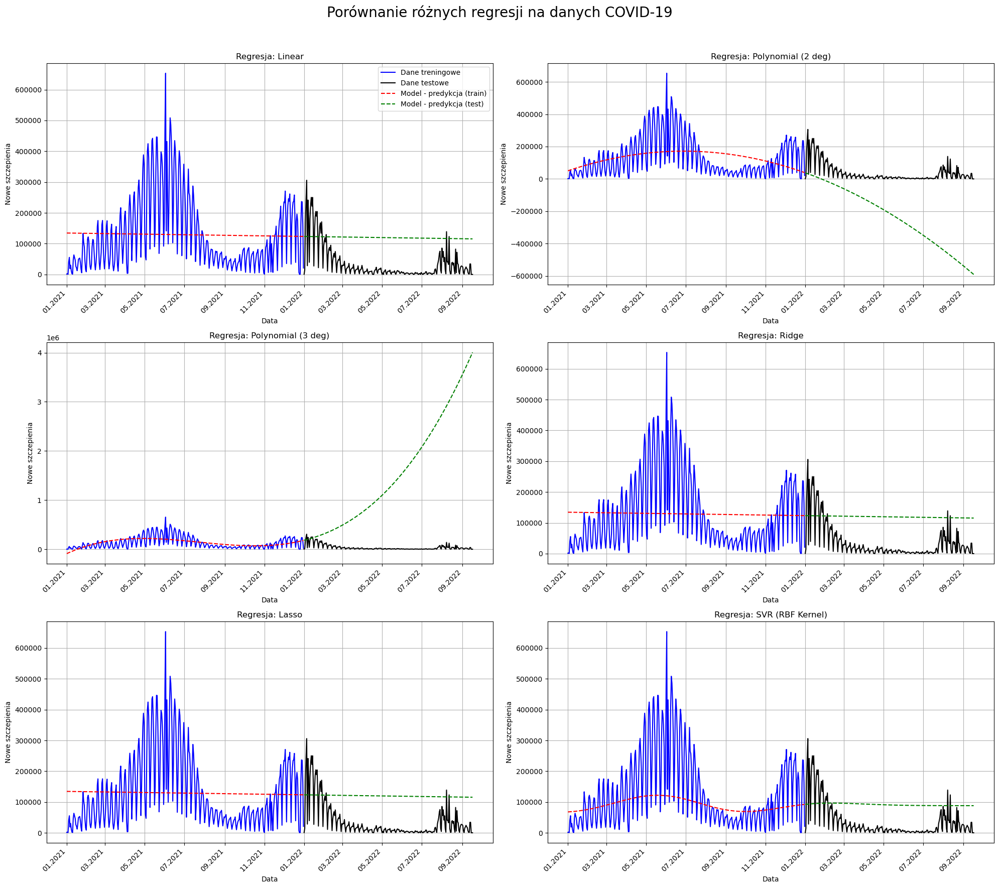

In [52]:
train_df = train_data['new_vaccine_doses_administered']
test_df = test_data['new_vaccine_doses_administered']

# Przygotowanie X i y
X_train = mdates.date2num(train_df.index).reshape(-1, 1)
y_train = train_df.values

X_test = mdates.date2num(test_df.index).reshape(-1, 1)
y_test = test_df.values

predictions = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    predictions[name] = (y_pred_train, y_pred_test)

# Wykres
fig, axes = plt.subplots(3, 2, figsize=(20, 18))
axes = axes.flatten()

# Formatowanie dat
locator = mdates.AutoDateLocator()
formatter = mdates.DateFormatter('%m.%Y')

for idx, (name, (y_pred_train, y_pred_test)) in enumerate(predictions.items()):
    ax = axes[idx]

    # Rysowanie danych rzeczywistych
    ax.plot(train_df.index, y_train, label='Dane treningowe', color='blue')
    ax.plot(test_df.index, y_test, label='Dane testowe', color='black')

    # Rysowanie predykcji
    ax.plot(train_df.index, y_pred_train, label='Model - predykcja (train)', linestyle='--', color='red')
    ax.plot(test_df.index, y_pred_test, label='Model - predykcja (test)', linestyle='--', color='green')

    ax.set_title(f'Regresja: {name}')
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xlabel('Data')
    ax.set_ylabel('Nowe szczepienia')

    ax.grid(True)
    if idx == 0:
        ax.legend()

for i in range(len(models), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Porównanie różnych regresji na danych COVID-19', fontsize=20)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [53]:
# Trening i ocena każdego modelu
model_results = {}

for model_name, model in models.items():
    model.fit(X_train, y_train)

    # Predykcja na danych testowych
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Ocena modelu
    train_metrics = evaluate_model(y_train, y_train_pred)
    test_metrics = evaluate_model(y_test, y_test_pred)

    model_results[model_name] = {
        "Train Metrics": train_metrics,
        "Test Metrics": test_metrics
    }

# Wyświetl wyniki dla każdego modelu
for model_name, metrics in model_results.items():
    print(f"Model: {model_name}")
    print("Training Metrics:")
    for metric, value in metrics["Train Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("Test Metrics:")
    for metric, value in metrics["Test Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("-" * 50)


Model: Linear
Training Metrics:
  MSE: 13691392783.2668
  MAE: 93238.7820
  RMSE: 117010.2251
  R2: 0.0007
  Variance of Residuals: 13691392783.2668
  Std Error of Residuals: 117010.2251
  CV: 0.9076
Test Metrics:
  MSE: 9992636888.3063
  MAE: 95749.0175
  RMSE: 99963.1777
  R2: -2.1987
  Variance of Residuals: 3001976819.6797
  Std Error of Residuals: 54790.2986
  CV: 1.5296
--------------------------------------------------
Model: Polynomial (2 deg)
Training Metrics:
  MSE: 12242820093.5773
  MAE: 89417.8202
  RMSE: 110647.2778
  R2: 0.1065
  Variance of Residuals: 12242820093.5773
  Std Error of Residuals: 110647.2778
  CV: 0.8582
Test Metrics:
  MSE: 100444750069.3085
  MAE: 270203.3037
  RMSE: 316930.1975
  R2: -31.1529
  Variance of Residuals: 27687032873.9374
  Std Error of Residuals: 166394.2093
  CV: 4.6454
--------------------------------------------------
Model: Polynomial (3 deg)
Training Metrics:
  MSE: 9271405715.7199
  MAE: 74384.7033
  RMSE: 96288.1390
  R2: 0.3233
  Va

new tested

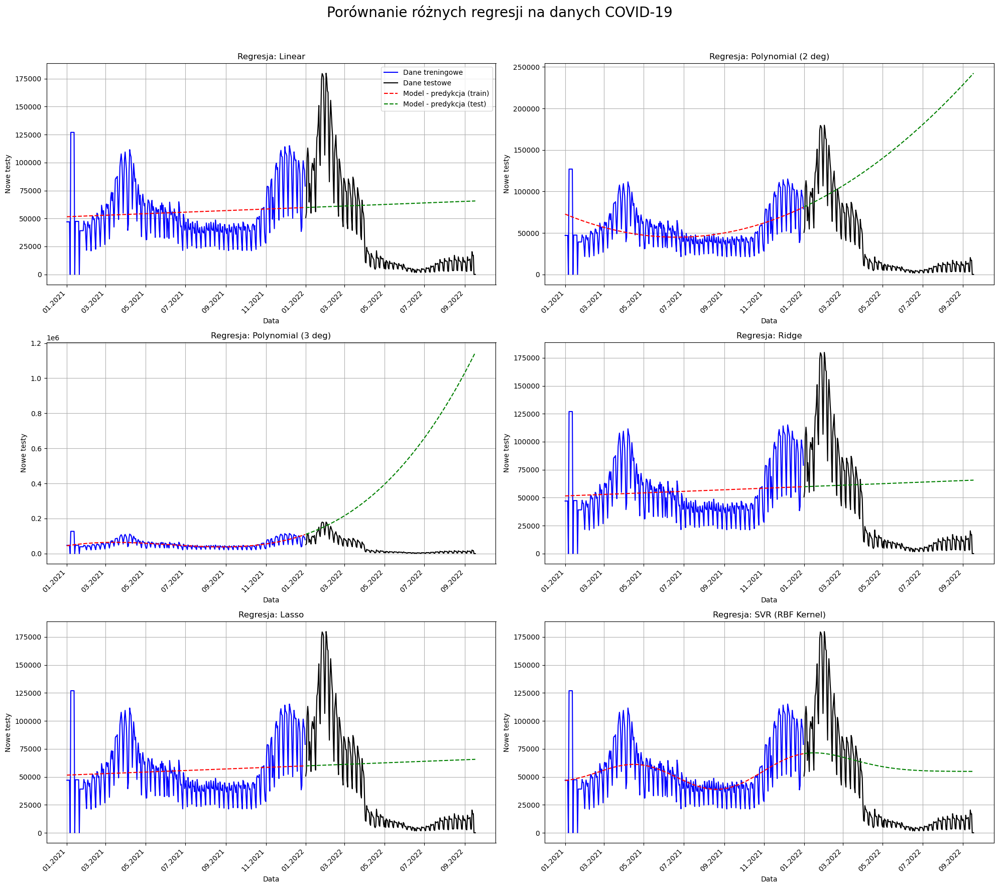

In [54]:
train_df = train_data['new_tested']
test_df = test_data['new_tested']

# Przygotowanie X i y
X_train = mdates.date2num(train_df.index).reshape(-1, 1)
y_train = train_df.values

X_test = mdates.date2num(test_df.index).reshape(-1, 1)
y_test = test_df.values

predictions = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    predictions[name] = (y_pred_train, y_pred_test)

# Wykres
fig, axes = plt.subplots(3, 2, figsize=(20, 18))
axes = axes.flatten()

# Formatowanie dat
locator = mdates.AutoDateLocator()
formatter = mdates.DateFormatter('%m.%Y')

for idx, (name, (y_pred_train, y_pred_test)) in enumerate(predictions.items()):
    ax = axes[idx]

    # Rysowanie danych rzeczywistych
    ax.plot(train_df.index, y_train, label='Dane treningowe', color='blue')
    ax.plot(test_df.index, y_test, label='Dane testowe', color='black')

    # Rysowanie predykcji
    ax.plot(train_df.index, y_pred_train, label='Model - predykcja (train)', linestyle='--', color='red')
    ax.plot(test_df.index, y_pred_test, label='Model - predykcja (test)', linestyle='--', color='green')

    ax.set_title(f'Regresja: {name}')
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xlabel('Data')
    ax.set_ylabel('Nowe testy')

    ax.grid(True)
    if idx == 0:
        ax.legend()

for i in range(len(models), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Porównanie różnych regresji na danych COVID-19', fontsize=20)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [55]:
# Trening i ocena każdego modelu
model_results = {}

for model_name, model in models.items():
    model.fit(X_train, y_train)

    # Predykcja na danych testowych
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Ocena modelu
    train_metrics = evaluate_model(y_train, y_train_pred)
    test_metrics = evaluate_model(y_test, y_test_pred)

    model_results[model_name] = {
        "Train Metrics": train_metrics,
        "Test Metrics": test_metrics
    }

# Wyświetl wyniki dla każdego modelu
for model_name, metrics in model_results.items():
    print(f"Model: {model_name}")
    print("Training Metrics:")
    for metric, value in metrics["Train Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("Test Metrics:")
    for metric, value in metrics["Test Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("-" * 50)


Model: Linear
Training Metrics:
  MSE: 615214280.0100
  MAE: 19427.5490
  RMSE: 24803.5135
  R2: 0.0091
  Variance of Residuals: 615214280.0100
  Std Error of Residuals: 24803.5135
  CV: 0.4455
Test Metrics:
  MSE: 2897218162.7527
  MAE: 49385.4591
  RMSE: 53825.8132
  R2: -0.3399
  Variance of Residuals: 2286930685.9700
  Std Error of Residuals: 47821.8641
  CV: 1.2574
--------------------------------------------------
Model: Polynomial (2 deg)
Training Metrics:
  MSE: 524430369.8297
  MAE: 18136.5656
  RMSE: 22900.4448
  R2: 0.1553
  Variance of Residuals: 524430369.8297
  Std Error of Residuals: 22900.4448
  CV: 0.4113
Test Metrics:
  MSE: 20350629156.9807
  MAE: 124330.2388
  RMSE: 142655.6314
  R2: -8.4115
  Variance of Residuals: 7545082043.5167
  Std Error of Residuals: 86862.4317
  CV: 2.2839
--------------------------------------------------
Model: Polynomial (3 deg)
Training Metrics:
  MSE: 409535458.5954
  MAE: 13982.8851
  RMSE: 20236.9824
  R2: 0.3404
  Variance of Residua

new recovered

C:\Users\Piotr\miniconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(


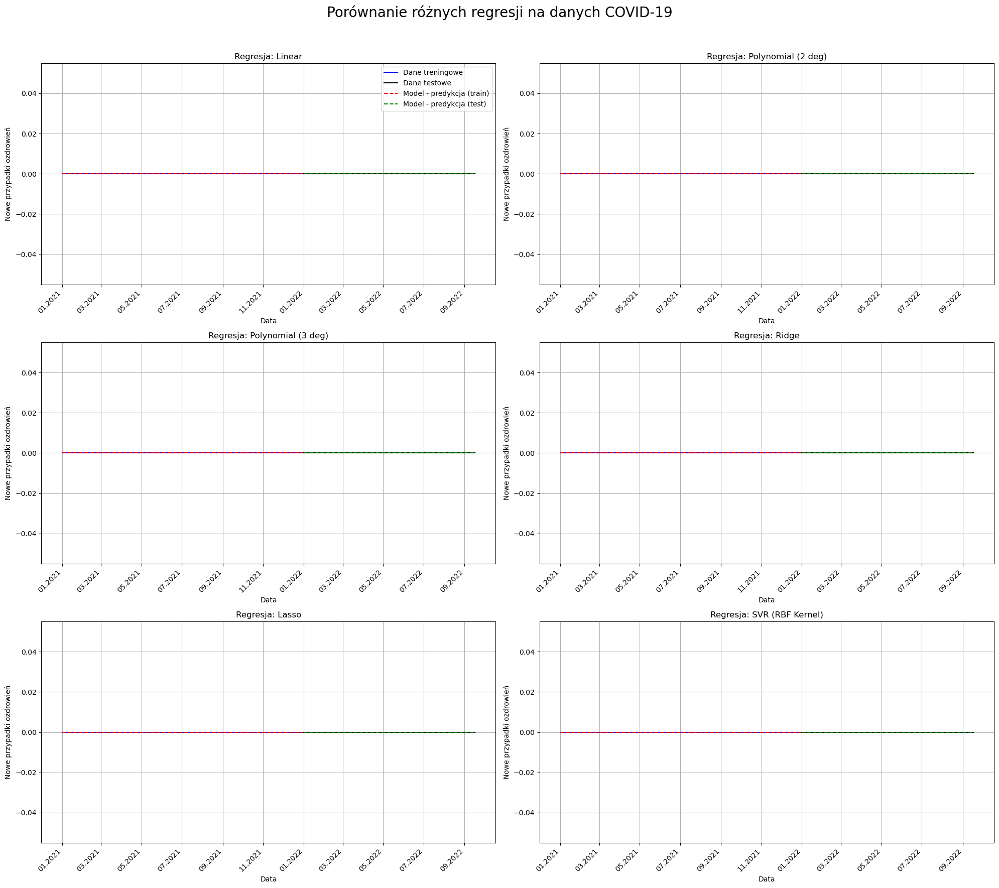

In [56]:
train_df = train_data['new_recovered']
test_df = test_data['new_recovered']

# Przygotowanie X i y
X_train = mdates.date2num(train_df.index).reshape(-1, 1)
y_train = train_df.values

X_test = mdates.date2num(test_df.index).reshape(-1, 1)
y_test = test_df.values

predictions = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    predictions[name] = (y_pred_train, y_pred_test)

# Wykres
fig, axes = plt.subplots(3, 2, figsize=(20, 18))
axes = axes.flatten()

# Formatowanie dat
locator = mdates.AutoDateLocator()
formatter = mdates.DateFormatter('%m.%Y')

for idx, (name, (y_pred_train, y_pred_test)) in enumerate(predictions.items()):
    ax = axes[idx]

    # Rysowanie danych rzeczywistych
    ax.plot(train_df.index, y_train, label='Dane treningowe', color='blue')
    ax.plot(test_df.index, y_test, label='Dane testowe', color='black')

    # Rysowanie predykcji
    ax.plot(train_df.index, y_pred_train, label='Model - predykcja (train)', linestyle='--', color='red')
    ax.plot(test_df.index, y_pred_test, label='Model - predykcja (test)', linestyle='--', color='green')

    ax.set_title(f'Regresja: {name}')
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xlabel('Data')
    ax.set_ylabel('Nowe przypadki ozdrowień')

    ax.grid(True)
    if idx == 0:
        ax.legend()

for i in range(len(models), len(axes)):
    fig.delaxes(axes[i])

fig.suptitle('Porównanie różnych regresji na danych COVID-19', fontsize=20)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [57]:
# Trening i ocena każdego modelu
model_results = {}

for model_name, model in models.items():
    model.fit(X_train, y_train)

    # Predykcja na danych testowych
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Ocena modelu
    train_metrics = evaluate_model(y_train, y_train_pred)
    test_metrics = evaluate_model(y_test, y_test_pred)

    model_results[model_name] = {
        "Train Metrics": train_metrics,
        "Test Metrics": test_metrics
    }

# Wyświetl wyniki dla każdego modelu
for model_name, metrics in model_results.items():
    print(f"Model: {model_name}")
    print("Training Metrics:")
    for metric, value in metrics["Train Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("Test Metrics:")
    for metric, value in metrics["Test Metrics"].items():
        print(f"  {metric}: {value:.4f}")
    print("-" * 50)


Model: Linear
Training Metrics:
  MSE: 0.0000
  MAE: 0.0000
  RMSE: 0.0000
  R2: 1.0000
  Variance of Residuals: 0.0000
  Std Error of Residuals: 0.0000
  CV: nan
Test Metrics:
  MSE: 0.0000
  MAE: 0.0000
  RMSE: 0.0000
  R2: 1.0000
  Variance of Residuals: 0.0000
  Std Error of Residuals: 0.0000
  CV: nan
--------------------------------------------------
Model: Polynomial (2 deg)
Training Metrics:
  MSE: 0.0000
  MAE: 0.0000
  RMSE: 0.0000
  R2: 1.0000
  Variance of Residuals: 0.0000
  Std Error of Residuals: 0.0000
  CV: nan
Test Metrics:
  MSE: 0.0000
  MAE: 0.0000
  RMSE: 0.0000
  R2: 1.0000
  Variance of Residuals: 0.0000
  Std Error of Residuals: 0.0000
  CV: nan
--------------------------------------------------
Model: Polynomial (3 deg)
Training Metrics:
  MSE: 0.0000
  MAE: 0.0000
  RMSE: 0.0000
  R2: 1.0000
  Variance of Residuals: 0.0000
  Std Error of Residuals: 0.0000
  CV: nan
Test Metrics:
  MSE: 0.0000
  MAE: 0.0000
  RMSE: 0.0000
  R2: 1.0000
  Variance of Residuals: 

C:\Users\Piotr\AppData\Local\Temp\ipykernel_57044\1218202943.py:13: RuntimeWarning: invalid value encountered in scalar divide
  cv = std_error_residuals / np.mean(y_true)
C:\Users\Piotr\AppData\Local\Temp\ipykernel_57044\1218202943.py:13: RuntimeWarning: invalid value encountered in scalar divide
  cv = std_error_residuals / np.mean(y_true)
C:\Users\Piotr\AppData\Local\Temp\ipykernel_57044\1218202943.py:13: RuntimeWarning: invalid value encountered in scalar divide
  cv = std_error_residuals / np.mean(y_true)
C:\Users\Piotr\AppData\Local\Temp\ipykernel_57044\1218202943.py:13: RuntimeWarning: invalid value encountered in scalar divide
  cv = std_error_residuals / np.mean(y_true)
C:\Users\Piotr\AppData\Local\Temp\ipykernel_57044\1218202943.py:13: RuntimeWarning: invalid value encountered in scalar divide
  cv = std_error_residuals / np.mean(y_true)
C:\Users\Piotr\AppData\Local\Temp\ipykernel_57044\1218202943.py:13: RuntimeWarning: invalid value encountered in scalar divide
  cv = std_er

5. Country regressions comparision

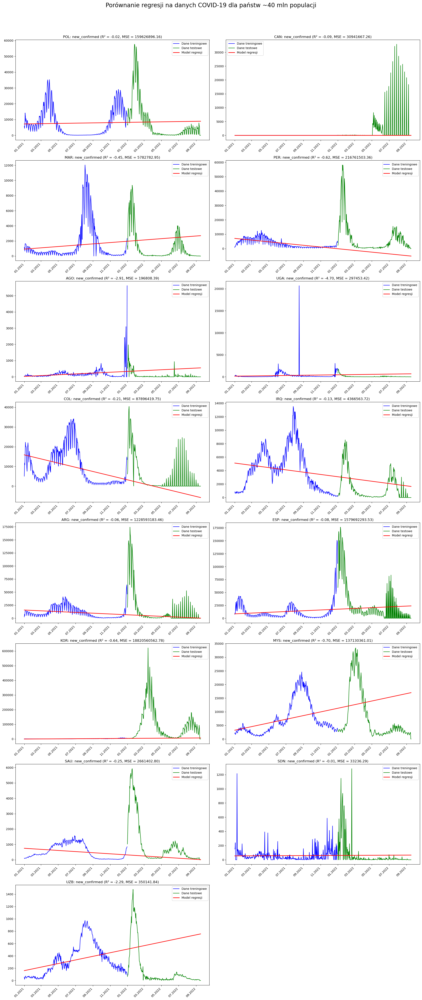

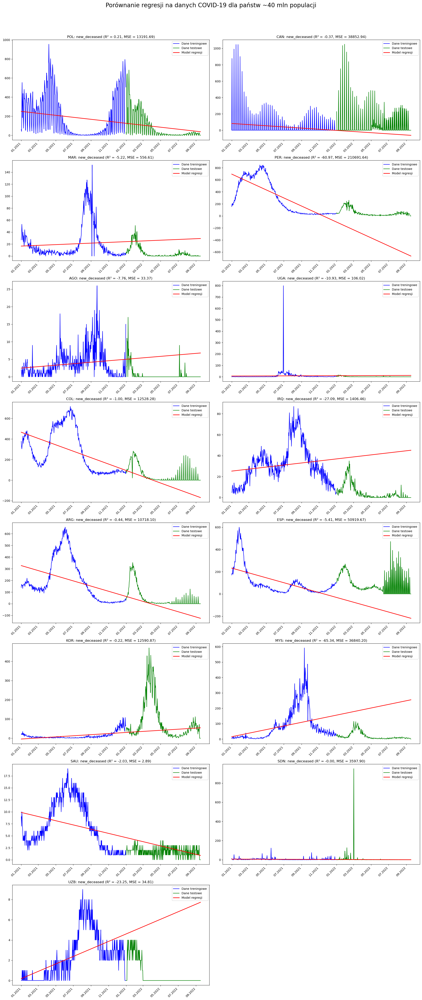

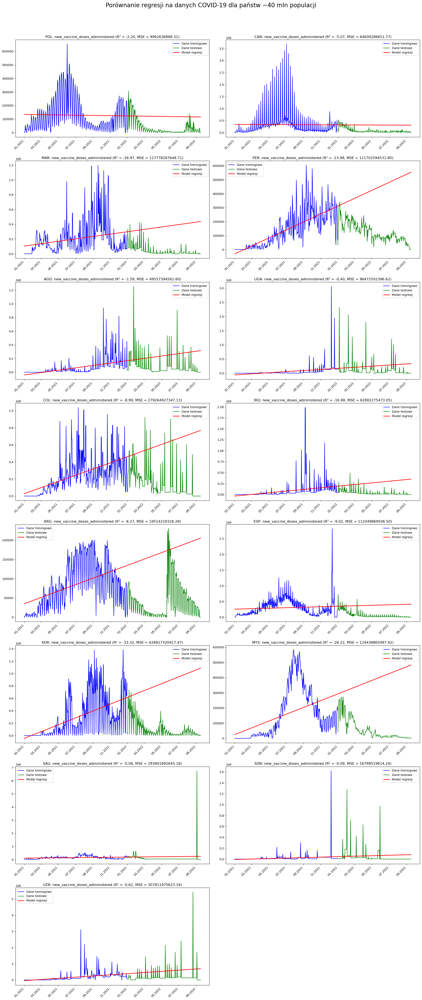

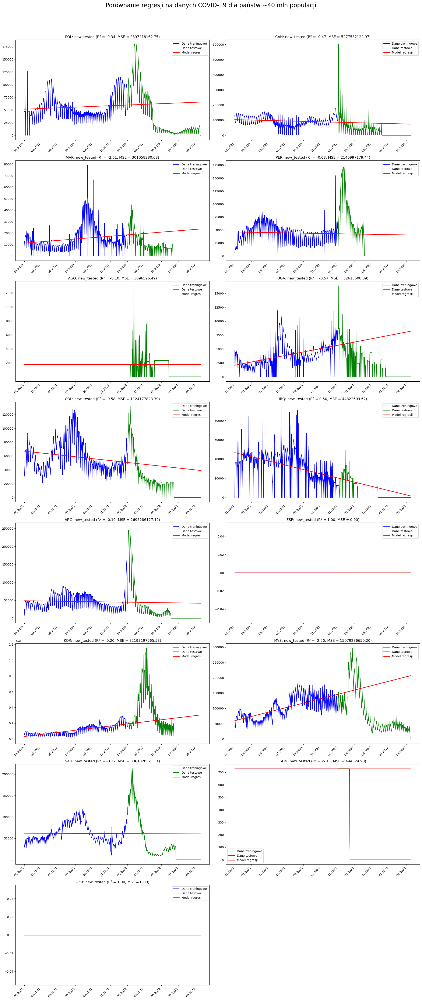

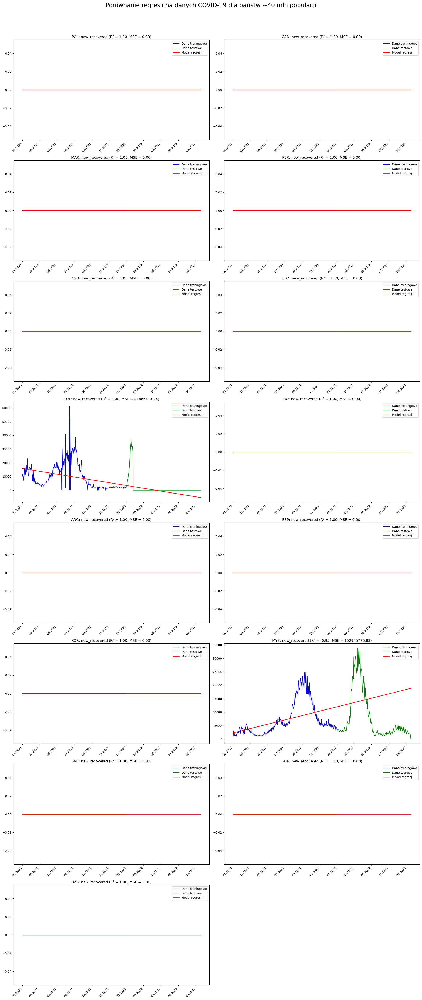

In [58]:
columns =  ['new_confirmed', 'new_deceased', 'new_vaccine_doses_administered', 'new_tested', 'new_recovered']
countries = ['POL', 'CAN', 'MAR', 'PER', 'AGO', 'UGA', 'COL', 'IRQ', 'ARG', 'ESP', 'KOR', 'MYS', 'SAU', 'SDN', 'UZB']

for  column in columns:
    fig, axes = plt.subplots(8, 2, figsize=(20, 48))
    axes = axes.flatten()

    # Formatowanie dat
    locator = mdates.AutoDateLocator()
    formatter = mdates.DateFormatter('%m.%Y')

    for idx,country in enumerate(countries):
        ax = axes[idx]

        train_df = df[(df.index >= '2021-01-01') & (df.index <= '2021-12-31') & (df['iso_3166_1_alpha_3'] == country)]
        test_df = df[(df.index > '2021-12-31') & (df['iso_3166_1_alpha_3'] == country)]

        train_df = train_df[column]
        test_df = test_df[column]

        X_train = mdates.date2num(train_df.index).reshape(-1, 1)
        y_train = train_df.values

        X_test = mdates.date2num(test_df.index).reshape(-1, 1)
        y_test = test_df.values

        # Tworzenie i trenowanie modelu regresji liniowej
        model = LinearRegression()
        model.fit(X_train, y_train)

        # Predykcja na danych testowych
        y_pred = model.predict(X_test)

        # Obliczanie metryk
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        # Wyświetlanie danych treningowych
        ax.plot(train_df.index, y_train, color='blue', linewidth=1.5, label='Dane treningowe')

        # Wyświetlanie danych testowych
        ax.plot(test_df.index, y_test, color='green', linewidth=1.5, label='Dane testowe')

        # Wyświetlanie linii regresji dla całego zakresu dat
        all_dates = np.concatenate([train_df.index.values, test_df.index.values])
        all_dates_num = mdates.date2num(all_dates).reshape(-1, 1)
        all_dates_sorted_idx = np.argsort(all_dates_num.flatten())
        all_dates_sorted = all_dates[all_dates_sorted_idx]
        all_dates_num_sorted = all_dates_num[all_dates_sorted_idx]
        all_pred = model.predict(all_dates_num_sorted)

        ax.plot(all_dates_sorted, all_pred, color='red', linewidth=2, label='Model regresji')

        # Formatowanie osi X
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)

        # Dodawanie tytułu i legendy
        ax.set_title(f'{country}: {column} (R² = {r2:.2f}, MSE = {mse:.2f})')
        ax.legend()

        # Rotacja etykiet osi X
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

    # Ukrywanie pustych wykresów
    for i in range(len(countries), len(axes)):
        axes[i].set_visible(False)

    fig.suptitle('Porównanie regresji na danych COVID-19 dla państw ~40 mln populacji', fontsize=20)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
